In [1]:
# AeroCNN-II
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

import datetime
%matplotlib inline

In [2]:
#from tensorflow.python.client import device_lib
#device_lib.list_local_devices()

In [3]:
#mirrored_strategy = tf.distribute.MirroredStrategy(["/GPU:0","/GPU:1", "/GPU:2"], cross_device_ops = tf.distribute.HierarchicalCopyAllReduce())

In [4]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 100
strides = 1
input_size = 100
lr=5e-04
batch_size=20

In [5]:
alpha = np.linspace(-10,20,16).reshape((16,1))

In [6]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [7]:
aa = aa.reshape((133, 16, 1, 1))

In [8]:
os.chdir('D:\\AeroCNN2Inputs')

In [9]:
origin = "D:\\AeroCNN2Inputs2"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_poisson = "D:\\CNN_poisson_files\\laplace\\bc2"

In [10]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [11]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data], axis=0)

In [12]:
image_np = image_df.iloc[:, :].values

In [13]:
image = image_np.reshape((133, 16, n_grid, n_grid))

In [14]:
image = 1-image/100

In [15]:
field_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin_poisson + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        field_df = pd.concat([field_df, data], axis=0)

In [16]:
field_np = field_df.iloc[:, :].values

In [17]:
imr = SimpleImputer(missing_values=np.nan, strategy='mean')
imr = imr.fit(field_np)
imputed_field = imr.transform(field_np)

In [18]:
field = imputed_field.reshape((133, 16, n_grid+1, n_grid+1))

In [19]:
field_nor = (field-np.min(field))/(np.max(field)-np.min(field))

In [20]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 1].values

In [21]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [22]:
geometry.shape

(2128, 1)

In [23]:
geometry = geometry.reshape((133, 16, 1))

In [24]:
x_all, x_test, aa_all, aa_test, geo_all, geo_test, y_all, y_test = train_test_split(image, aa, geometry, field_nor, test_size=0.1, random_state=1)

In [25]:
x_train, x_val, aa_train, aa_val, geo_train, geo_val, y_train, y_val = train_test_split(x_all, aa_all, geo_all, y_all, test_size=0.1, random_state=1)

In [26]:
x_train = x_train.reshape((x_train.shape[0]*x_train.shape[1], x_train.shape[2], x_train.shape[3], 1))
x_val = x_val.reshape((x_val.shape[0]*x_val.shape[1], x_val.shape[2], x_val.shape[3], 1))
x_test = x_test.reshape((x_test.shape[0]*x_test.shape[1], x_test.shape[2], x_test.shape[3], 1))
aa_train = aa_train.reshape((aa_train.shape[0]*aa_train.shape[1], aa_train.shape[2], aa_train.shape[3]))
aa_val = aa_val.reshape((aa_val.shape[0]*aa_val.shape[1], aa_val.shape[2], aa_val.shape[3]))
aa_test = aa_test.reshape((aa_test.shape[0]*aa_test.shape[1], aa_test.shape[2], aa_test.shape[3]))
geo_train = geo_train.reshape((geo_train.shape[0]*geo_train.shape[1], geo_train.shape[2]))
geo_val = geo_val.reshape((geo_val.shape[0]*geo_val.shape[1], geo_val.shape[2]))
geo_test = geo_test.reshape((geo_test.shape[0]*geo_test.shape[1], geo_test.shape[2]))
y_train = y_train.reshape((y_train.shape[0]*y_train.shape[1], y_train.shape[2], y_train.shape[3], 1))
y_val = y_val.reshape((y_val.shape[0]*y_val.shape[1], y_val.shape[2], y_val.shape[3], 1))
y_test = y_test.reshape((y_test.shape[0]*y_test.shape[1], y_test.shape[2], y_test.shape[3], 1))

In [27]:
tf.keras.backend.set_image_data_format('channels_last')

In [28]:
#with mirrored_strategy.scope():
input_image = tf.keras.Input(shape=(n_grid, n_grid, 1))
#reshape0 = tf.keras.layers.Reshape(())

x_conv = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayer1')(input_image)
x_ = tf.keras.layers.MaxPooling2D((2,2))(x_conv)
x_conv = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size1, kernel_size1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayer2')(x_)
x_ = tf.keras.layers.MaxPooling2D((2,2))(x_conv)

x_conv = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size1, kernel_size1),
                                         strides=(2,2),
                                         activation='relu', padding='same',
                                         kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                         name='Conv2DTLayer1')(x_)
x_conv = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                         strides=(2,2),
                                         activation='relu', padding='same',
                                         kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                         name='Conv2DTLayer2')(x_conv)

x_conv = tf.keras.layers.Conv2D(1, (1, 1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayerFinal')(x_conv)
x_ = tf.keras.layers.Flatten()(x_conv)
x_ = tf.keras.layers.Dense(units=(n_grid+1)**2, activation='linear', name='FCLayer1',
                           kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer))(x_)
#x_ = tf.keras.layers.Dense(units=101*101, activation='linear', name='outputLayer')(x_)
output_data = tf.keras.layers.Reshape((n_grid+1,n_grid+1,1))(x_)

# AeroCNN-II
model = tf.keras.Model(input_image, output_data)

In [29]:
#with mirrored_strategy.scope():
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100, 100, 1)]     0         
                                                                 
 Conv2DLayer1 (Conv2D)       (None, 100, 100, 100)     1000      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 50, 50, 100)      0         
 )                                                               
                                                                 
 Conv2DLayer2 (Conv2D)       (None, 50, 50, 200)       180200    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 25, 25, 200)      0         
 2D)                                                             
                                                                 
 Conv2DTLayer1 (Conv2DTransp  (None, 50, 50, 200)      360200

In [30]:
#with mirrored_strategy.scope():
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [31]:
#with mirrored_strategy.scope():
start = datetime.datetime.now()
history = model.fit(x_train, y_train, validation_data=[x_val, y_val],
                    epochs=5000, shuffle=True, batch_size=batch_size,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100,
                                                                restore_best_weights=True)])
end = datetime.datetime.now()

Epoch 1/5000
86/86 [==============================] - 19s 58ms/step - loss: 0.0277 - rmse: 0.1664 - val_loss: 1.3195e-04 - val_rmse: 0.0110
Epoch 2/5000
86/86 [==============================] - 3s 35ms/step - loss: 1.3849e-04 - rmse: 0.0113 - val_loss: 1.3158e-04 - val_rmse: 0.0110
Epoch 3/5000
86/86 [==============================] - 3s 33ms/step - loss: 1.3846e-04 - rmse: 0.0113 - val_loss: 1.3483e-04 - val_rmse: 0.0111
Epoch 4/5000
86/86 [==============================] - 3s 33ms/step - loss: 1.3570e-04 - rmse: 0.0112 - val_loss: 1.2009e-04 - val_rmse: 0.0105
Epoch 5/5000
86/86 [==============================] - 3s 33ms/step - loss: 1.2505e-04 - rmse: 0.0107 - val_loss: 1.0253e-04 - val_rmse: 0.0096
Epoch 6/5000
86/86 [==============================] - 3s 33ms/step - loss: 6.8280e-05 - rmse: 0.0076 - val_loss: 2.6126e-05 - val_rmse: 0.0039
Epoch 7/5000
86/86 [==============================] - 3s 33ms/step - loss: 2.7101e-05 - rmse: 0.0040 - val_loss: 2.0972e-05 - val_rmse: 0.0032
Ep

Epoch 58/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.5024e-05 - rmse: 0.0050 - val_loss: 1.2874e-05 - val_rmse: 0.0016
Epoch 59/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.9402e-05 - rmse: 0.0030 - val_loss: 1.4114e-05 - val_rmse: 0.0020
Epoch 60/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.3851e-05 - rmse: 0.0058 - val_loss: 2.1510e-05 - val_rmse: 0.0034
Epoch 61/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.4617e-05 - rmse: 0.0038 - val_loss: 1.6479e-05 - val_rmse: 0.0025
Epoch 62/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.9117e-05 - rmse: 0.0030 - val_loss: 7.6242e-05 - val_rmse: 0.0081
Epoch 63/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.8848e-05 - rmse: 0.0043 - val_loss: 1.4699e-05 - val_rmse: 0.0021
Epoch 64/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0529e-05 - rmse: 0.0032 - val_loss: 5.3035e-05 - val_rmse:

Epoch 115/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.6448e-05 - rmse: 0.0026 - val_loss: 1.8305e-05 - val_rmse: 0.0030
Epoch 116/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5264e-05 - rmse: 0.0040 - val_loss: 1.2830e-05 - val_rmse: 0.0018
Epoch 117/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.6537e-05 - rmse: 0.0027 - val_loss: 1.1169e-05 - val_rmse: 0.0013
Epoch 118/5000
86/86 [==============================] - 3s 33ms/step - loss: 1.2378e-05 - rmse: 0.0017 - val_loss: 1.0432e-05 - val_rmse: 9.9682e-04
Epoch 119/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.2395e-05 - rmse: 0.0017 - val_loss: 1.1350e-05 - val_rmse: 0.0014
Epoch 120/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.3700e-05 - rmse: 0.0021 - val_loss: 1.4633e-05 - val_rmse: 0.0023
Epoch 121/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.4320e-05 - rmse: 0.0022 - val_loss: 1.3397e-05 

86/86 [==============================] - 3s 31ms/step - loss: 1.1231e-05 - rmse: 0.0016 - val_loss: 1.0153e-05 - val_rmse: 0.0012
Epoch 172/5000
86/86 [==============================] - 3s 33ms/step - loss: 1.0750e-05 - rmse: 0.0014 - val_loss: 1.0798e-05 - val_rmse: 0.0014
Epoch 173/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0765e-05 - rmse: 0.0014 - val_loss: 1.0330e-05 - val_rmse: 0.0013
Epoch 174/5000
86/86 [==============================] - 3s 33ms/step - loss: 1.0434e-05 - rmse: 0.0013 - val_loss: 1.0298e-05 - val_rmse: 0.0012
Epoch 175/5000
86/86 [==============================] - 3s 33ms/step - loss: 1.0385e-05 - rmse: 0.0013 - val_loss: 9.8187e-06 - val_rmse: 0.0010
Epoch 176/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0472e-05 - rmse: 0.0013 - val_loss: 1.0955e-05 - val_rmse: 0.0015
Epoch 177/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0550e-05 - rmse: 0.0014 - val_loss: 9.8507e-06 - val_rmse: 0.0011


86/86 [==============================] - 3s 31ms/step - loss: 9.8338e-06 - rmse: 0.0013 - val_loss: 1.0405e-05 - val_rmse: 0.0015
Epoch 228/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.9846e-06 - rmse: 0.0014 - val_loss: 9.6096e-06 - val_rmse: 0.0012
Epoch 229/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.8293e-06 - rmse: 0.0013 - val_loss: 1.0346e-05 - val_rmse: 0.0015
Epoch 230/5000
86/86 [==============================] - 3s 33ms/step - loss: 9.4559e-06 - rmse: 0.0012 - val_loss: 9.0947e-06 - val_rmse: 0.0010
Epoch 231/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.6113e-06 - rmse: 0.0012 - val_loss: 9.8070e-06 - val_rmse: 0.0013
Epoch 232/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0530e-05 - rmse: 0.0016 - val_loss: 8.8126e-06 - val_rmse: 8.8019e-04
Epoch 233/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0106e-05 - rmse: 0.0014 - val_loss: 8.9601e-06 - val_rmse: 9.6

86/86 [==============================] - 3s 31ms/step - loss: 1.0542e-05 - rmse: 0.0018 - val_loss: 9.0474e-06 - val_rmse: 0.0013
Epoch 284/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.5563e-06 - rmse: 0.0015 - val_loss: 9.3245e-06 - val_rmse: 0.0014
Epoch 285/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.4751e-06 - rmse: 0.0014 - val_loss: 1.0823e-05 - val_rmse: 0.0018
Epoch 286/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0265e-05 - rmse: 0.0017 - val_loss: 9.5309e-06 - val_rmse: 0.0015
Epoch 287/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0521e-05 - rmse: 0.0018 - val_loss: 8.4817e-06 - val_rmse: 0.0010
Epoch 288/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.6538e-06 - rmse: 0.0015 - val_loss: 9.5214e-06 - val_rmse: 0.0015
Epoch 289/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1703e-05 - rmse: 0.0021 - val_loss: 1.4653e-05 - val_rmse: 0.0027


86/86 [==============================] - 3s 31ms/step - loss: 9.2735e-06 - rmse: 0.0016 - val_loss: 8.4423e-06 - val_rmse: 0.0013
Epoch 340/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.1668e-06 - rmse: 0.0015 - val_loss: 1.0975e-05 - val_rmse: 0.0020
Epoch 341/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.3502e-06 - rmse: 0.0016 - val_loss: 7.8438e-06 - val_rmse: 0.0010
Epoch 342/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0292e-05 - rmse: 0.0019 - val_loss: 1.3134e-05 - val_rmse: 0.0025
Epoch 343/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0981e-05 - rmse: 0.0020 - val_loss: 7.8403e-06 - val_rmse: 0.0010
Epoch 344/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.5765e-06 - rmse: 0.0017 - val_loss: 1.1644e-05 - val_rmse: 0.0022
Epoch 345/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.9586e-06 - rmse: 0.0018 - val_loss: 8.1668e-06 - val_rmse: 0.0012


86/86 [==============================] - 3s 31ms/step - loss: 8.4861e-06 - rmse: 0.0015 - val_loss: 1.0348e-05 - val_rmse: 0.0020
Epoch 396/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.9678e-06 - rmse: 0.0013 - val_loss: 7.8473e-06 - val_rmse: 0.0013
Epoch 397/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.5504e-06 - rmse: 0.0018 - val_loss: 7.0574e-06 - val_rmse: 9.0194e-04
Epoch 398/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.6276e-06 - rmse: 0.0018 - val_loss: 2.1722e-05 - val_rmse: 0.0039
Epoch 399/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.2900e-06 - rmse: 0.0014 - val_loss: 7.1286e-06 - val_rmse: 9.5086e-04
Epoch 400/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1224e-05 - rmse: 0.0022 - val_loss: 1.9049e-05 - val_rmse: 0.0036
Epoch 401/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.7472e-06 - rmse: 0.0016 - val_loss: 6.9364e-06 - val_rmse:

86/86 [==============================] - 3s 31ms/step - loss: 8.7521e-06 - rmse: 0.0017 - val_loss: 1.0290e-05 - val_rmse: 0.0021
Epoch 452/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.5909e-06 - rmse: 0.0014 - val_loss: 7.3265e-06 - val_rmse: 0.0013
Epoch 453/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.1862e-06 - rmse: 0.0012 - val_loss: 8.0084e-06 - val_rmse: 0.0015
Epoch 454/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.2465e-06 - rmse: 0.0016 - val_loss: 8.6084e-06 - val_rmse: 0.0017
Epoch 455/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.8103e-06 - rmse: 0.0014 - val_loss: 1.5183e-05 - val_rmse: 0.0031
Epoch 456/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.8844e-06 - rmse: 0.0018 - val_loss: 6.8033e-06 - val_rmse: 0.0011
Epoch 457/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.0335e-06 - rmse: 0.0012 - val_loss: 6.8956e-06 - val_rmse: 0.0011


86/86 [==============================] - 3s 31ms/step - loss: 6.4306e-06 - rmse: 0.0011 - val_loss: 5.9060e-06 - val_rmse: 7.9558e-04
Epoch 508/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.3161e-06 - rmse: 0.0010 - val_loss: 5.9256e-06 - val_rmse: 8.1288e-04
Epoch 509/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.3206e-06 - rmse: 0.0010 - val_loss: 6.3379e-06 - val_rmse: 0.0010
Epoch 510/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.6737e-06 - rmse: 0.0012 - val_loss: 5.9255e-06 - val_rmse: 8.2257e-04
Epoch 511/5000
86/86 [==============================] - 3s 34ms/step - loss: 6.2324e-06 - rmse: 9.9377e-04 - val_loss: 6.3754e-06 - val_rmse: 0.0011
Epoch 512/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.3628e-06 - rmse: 0.0011 - val_loss: 6.3851e-06 - val_rmse: 0.0011
Epoch 513/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.9906e-06 - rmse: 0.0013 - val_loss: 6.2431e-06 - v

Epoch 563/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.3936e-06 - rmse: 0.0016 - val_loss: 6.1706e-06 - val_rmse: 0.0012
Epoch 564/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.0244e-06 - rmse: 0.0011 - val_loss: 5.5808e-06 - val_rmse: 8.6814e-04
Epoch 565/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.8689e-06 - rmse: 0.0022 - val_loss: 8.0706e-06 - val_rmse: 0.0018
Epoch 566/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.3296e-06 - rmse: 0.0019 - val_loss: 6.1347e-06 - val_rmse: 0.0011
Epoch 567/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.0762e-06 - rmse: 0.0011 - val_loss: 5.4537e-06 - val_rmse: 8.0529e-04
Epoch 568/5000
86/86 [==============================] - 3s 33ms/step - loss: 5.8388e-06 - rmse: 0.0010 - val_loss: 6.8046e-06 - val_rmse: 0.0014
Epoch 569/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.4184e-06 - rmse: 0.0013 - val_loss: 5.6996e

86/86 [==============================] - 3s 31ms/step - loss: 5.8809e-06 - rmse: 0.0012 - val_loss: 4.9476e-06 - val_rmse: 7.1475e-04
Epoch 620/5000
86/86 [==============================] - 3s 33ms/step - loss: 5.4721e-06 - rmse: 0.0010 - val_loss: 5.0122e-06 - val_rmse: 7.6312e-04
Epoch 621/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.8807e-06 - rmse: 0.0012 - val_loss: 5.3375e-06 - val_rmse: 9.5636e-04
Epoch 622/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.3865e-06 - rmse: 0.0014 - val_loss: 5.2671e-06 - val_rmse: 9.2226e-04
Epoch 623/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.7998e-06 - rmse: 0.0012 - val_loss: 5.5315e-06 - val_rmse: 0.0011
Epoch 624/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.1835e-06 - rmse: 0.0017 - val_loss: 1.0455e-05 - val_rmse: 0.0025
Epoch 625/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.2776e-06 - rmse: 0.0014 - val_loss: 5.4908e-06 - v

86/86 [==============================] - 3s 31ms/step - loss: 5.1629e-06 - rmse: 0.0010 - val_loss: 4.9601e-06 - val_rmse: 9.3787e-04
Epoch 675/5000
86/86 [==============================] - 3s 33ms/step - loss: 5.0590e-06 - rmse: 9.9064e-04 - val_loss: 5.5716e-06 - val_rmse: 0.0012
Epoch 676/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.0307e-06 - rmse: 0.0014 - val_loss: 4.9156e-06 - val_rmse: 9.2060e-04
Epoch 677/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.8476e-06 - rmse: 0.0013 - val_loss: 5.9754e-06 - val_rmse: 0.0014
Epoch 678/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.0715e-06 - rmse: 0.0010 - val_loss: 4.5223e-06 - val_rmse: 6.8295e-04
Epoch 679/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.3496e-06 - rmse: 0.0015 - val_loss: 4.7138e-06 - val_rmse: 8.1484e-04
Epoch 680/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.3860e-06 - rmse: 0.0012 - val_loss: 4.9899e-06

Epoch 730/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0722e-05 - rmse: 0.0026 - val_loss: 4.4734e-06 - val_rmse: 8.5052e-04
Epoch 731/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.8589e-06 - rmse: 0.0011 - val_loss: 6.2168e-06 - val_rmse: 0.0016
Epoch 732/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.3642e-06 - rmse: 0.0013 - val_loss: 4.1606e-06 - val_rmse: 6.4982e-04
Epoch 733/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.9248e-06 - rmse: 0.0011 - val_loss: 5.7551e-06 - val_rmse: 0.0014
Epoch 734/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.0023e-06 - rmse: 0.0011 - val_loss: 4.3431e-06 - val_rmse: 7.8501e-04
Epoch 735/5000
86/86 [==============================] - 3s 33ms/step - loss: 4.6532e-06 - rmse: 9.6385e-04 - val_loss: 4.2165e-06 - val_rmse: 7.0363e-04
Epoch 736/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.9085e-06 - rmse: 0.0011 - val_l

86/86 [==============================] - 3s 33ms/step - loss: 4.2345e-06 - rmse: 8.8353e-04 - val_loss: 4.1194e-06 - val_rmse: 8.1747e-04
Epoch 786/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.7277e-06 - rmse: 0.0011 - val_loss: 7.9153e-06 - val_rmse: 0.0021
Epoch 787/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.1880e-06 - rmse: 0.0013 - val_loss: 4.7746e-06 - val_rmse: 0.0012
Epoch 788/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.7783e-06 - rmse: 0.0012 - val_loss: 3.9611e-06 - val_rmse: 7.2493e-04
Epoch 789/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.4064e-06 - rmse: 0.0014 - val_loss: 3.9856e-06 - val_rmse: 7.4497e-04
Epoch 790/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.8745e-06 - rmse: 0.0012 - val_loss: 5.1755e-06 - val_rmse: 0.0013
Epoch 791/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.8974e-06 - rmse: 0.0012 - val_loss: 3.9291e-06 - v

86/86 [==============================] - 3s 31ms/step - loss: 4.8604e-06 - rmse: 0.0013 - val_loss: 3.5890e-06 - val_rmse: 6.3879e-04
Epoch 841/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.8472e-06 - rmse: 0.0013 - val_loss: 3.6888e-06 - val_rmse: 7.1597e-04
Epoch 842/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.5973e-06 - rmse: 0.0012 - val_loss: 3.6537e-06 - val_rmse: 6.9440e-04
Epoch 843/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.7483e-06 - rmse: 0.0013 - val_loss: 4.3669e-06 - val_rmse: 0.0011
Epoch 844/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.9553e-06 - rmse: 0.0019 - val_loss: 4.1553e-06 - val_rmse: 9.9664e-04
Epoch 845/5000
86/86 [==============================] - 3s 33ms/step - loss: 3.9878e-06 - rmse: 9.0990e-04 - val_loss: 5.3374e-06 - val_rmse: 0.0015
Epoch 846/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.8929e-06 - rmse: 0.0013 - val_loss: 4.9649e-06

86/86 [==============================] - 3s 31ms/step - loss: 1.1034e-05 - rmse: 0.0028 - val_loss: 4.1682e-06 - val_rmse: 0.0011
Epoch 896/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9632e-06 - rmse: 0.0010 - val_loss: 3.5824e-06 - val_rmse: 8.0901e-04
Epoch 897/5000
86/86 [==============================] - 3s 33ms/step - loss: 3.5645e-06 - rmse: 7.9917e-04 - val_loss: 4.2079e-06 - val_rmse: 0.0011
Epoch 898/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.0615e-06 - rmse: 0.0011 - val_loss: 4.7327e-06 - val_rmse: 0.0013
Epoch 899/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.3384e-05 - rmse: 0.0032 - val_loss: 3.8679e-06 - val_rmse: 9.7529e-04
Epoch 900/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9079e-06 - rmse: 9.9669e-04 - val_loss: 3.5899e-06 - val_rmse: 8.2312e-04
Epoch 901/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.7300e-06 - rmse: 9.0544e-04 - val_loss: 3.7031

Epoch 950/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.8295e-06 - rmse: 0.0011 - val_loss: 3.3079e-06 - val_rmse: 7.6829e-04
Epoch 951/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.2317e-06 - rmse: 0.0012 - val_loss: 3.2250e-06 - val_rmse: 7.1502e-04
Epoch 952/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.0500e-06 - rmse: 0.0012 - val_loss: 5.3778e-06 - val_rmse: 0.0016
Epoch 953/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.8126e-06 - rmse: 0.0011 - val_loss: 3.3027e-06 - val_rmse: 7.7268e-04
Epoch 954/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9438e-06 - rmse: 0.0011 - val_loss: 3.2419e-06 - val_rmse: 7.3488e-04
Epoch 955/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.4323e-06 - rmse: 0.0013 - val_loss: 3.5835e-06 - val_rmse: 9.4098e-04
Epoch 956/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.8350e-06 - rmse: 0.0011 - val_l

86/86 [==============================] - 3s 31ms/step - loss: 3.8718e-06 - rmse: 0.0012 - val_loss: 2.9293e-06 - val_rmse: 6.4883e-04
Epoch 1006/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.5025e-06 - rmse: 9.9807e-04 - val_loss: 3.4686e-06 - val_rmse: 9.8192e-04
Epoch 1007/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.7205e-06 - rmse: 0.0015 - val_loss: 4.6398e-06 - val_rmse: 0.0015
Epoch 1008/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.2653e-06 - rmse: 0.0017 - val_loss: 5.3406e-06 - val_rmse: 0.0017
Epoch 1009/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9739e-06 - rmse: 0.0012 - val_loss: 3.1185e-06 - val_rmse: 7.9033e-04
Epoch 1010/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.6507e-06 - rmse: 0.0011 - val_loss: 3.4175e-06 - val_rmse: 9.6308e-04
Epoch 1011/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.0468e-06 - rmse: 0.0012 - val_loss: 2.93

Epoch 1060/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.7306e-06 - rmse: 0.0012 - val_loss: 3.6105e-06 - val_rmse: 0.0011
Epoch 1061/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.3743e-06 - rmse: 0.0010 - val_loss: 3.0803e-06 - val_rmse: 8.7310e-04
Epoch 1062/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.6432e-06 - rmse: 0.0012 - val_loss: 2.7231e-06 - val_rmse: 6.3899e-04
Epoch 1063/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.1903e-06 - rmse: 9.3660e-04 - val_loss: 4.4482e-06 - val_rmse: 0.0015
Epoch 1064/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.5460e-06 - rmse: 0.0011 - val_loss: 6.7238e-06 - val_rmse: 0.0021
Epoch 1065/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.4347e-06 - rmse: 0.0011 - val_loss: 4.1971e-06 - val_rmse: 0.0014
Epoch 1066/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.2786e-06 - rmse: 9.8778e-04 - va

Epoch 1115/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.1905e-06 - rmse: 0.0010 - val_loss: 2.9249e-06 - val_rmse: 8.8317e-04
Epoch 1116/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.0696e-06 - rmse: 9.6234e-04 - val_loss: 2.6655e-06 - val_rmse: 7.2366e-04
Epoch 1117/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.1815e-06 - rmse: 0.0010 - val_loss: 3.0294e-06 - val_rmse: 9.4382e-04
Epoch 1118/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.1820e-06 - rmse: 0.0010 - val_loss: 2.7081e-06 - val_rmse: 7.5656e-04
Epoch 1119/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.4058e-06 - rmse: 0.0011 - val_loss: 3.9768e-06 - val_rmse: 0.0014
Epoch 1120/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.2080e-06 - rmse: 0.0014 - val_loss: 6.3562e-06 - val_rmse: 0.0021
Epoch 1121/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.8870e-06 - rmse: 0.0013 

86/86 [==============================] - 3s 31ms/step - loss: 1.2633e-05 - rmse: 0.0033 - val_loss: 3.2960e-06 - val_rmse: 0.0011
Epoch 1170/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.8462e-06 - rmse: 9.1853e-04 - val_loss: 2.8125e-06 - val_rmse: 9.0088e-04
Epoch 1171/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.7640e-06 - rmse: 8.7429e-04 - val_loss: 2.3837e-06 - val_rmse: 6.2080e-04
Epoch 1172/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.7243e-06 - rmse: 8.5293e-04 - val_loss: 2.7029e-06 - val_rmse: 8.4120e-04
Epoch 1173/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.6948e-06 - rmse: 8.3711e-04 - val_loss: 2.8083e-06 - val_rmse: 9.0335e-04
Epoch 1174/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.8480e-06 - rmse: 9.2572e-04 - val_loss: 2.3684e-06 - val_rmse: 6.1541e-04
Epoch 1175/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.0528e-06 - rmse: 0.0

86/86 [==============================] - 3s 31ms/step - loss: 3.1604e-06 - rmse: 0.0011 - val_loss: 2.7272e-06 - val_rmse: 9.3366e-04
Epoch 1224/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.3006e-06 - rmse: 0.0012 - val_loss: 2.2156e-06 - val_rmse: 6.0251e-04
Epoch 1225/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9369e-06 - rmse: 0.0014 - val_loss: 2.2791e-06 - val_rmse: 6.5507e-04
Epoch 1226/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.8009e-06 - rmse: 0.0014 - val_loss: 2.3795e-06 - val_rmse: 7.2954e-04
Epoch 1227/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.4301e-06 - rmse: 7.6430e-04 - val_loss: 2.8094e-06 - val_rmse: 9.8209e-04
Epoch 1228/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5335e-06 - rmse: 8.3073e-04 - val_loss: 5.4756e-06 - val_rmse: 0.0019
Epoch 1229/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.0459e-06 - rmse: 0.0011 - val_lo

Epoch 1278/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.9713e-06 - rmse: 0.0011 - val_loss: 4.0254e-06 - val_rmse: 0.0015
Epoch 1279/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.1258e-06 - rmse: 0.0012 - val_loss: 2.0159e-06 - val_rmse: 5.4866e-04
Epoch 1280/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.6860e-06 - rmse: 9.8606e-04 - val_loss: 4.1174e-06 - val_rmse: 0.0016
Epoch 1281/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.7851e-06 - rmse: 0.0010 - val_loss: 2.6697e-06 - val_rmse: 9.7950e-04
Epoch 1282/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.7020e-06 - rmse: 9.9655e-04 - val_loss: 2.0116e-06 - val_rmse: 5.5120e-04
Epoch 1283/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.2806e-06 - rmse: 0.0013 - val_loss: 4.3478e-06 - val_rmse: 0.0016
Epoch 1284/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.7591e-06 - rmse: 0.0010 

86/86 [==============================] - 3s 31ms/step - loss: 5.8618e-06 - rmse: 0.0021 - val_loss: 2.3633e-06 - val_rmse: 8.7701e-04
Epoch 1333/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.4050e-06 - rmse: 9.0094e-04 - val_loss: 2.2699e-06 - val_rmse: 8.2326e-04
Epoch 1334/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.4282e-06 - rmse: 9.1497e-04 - val_loss: 2.0464e-06 - val_rmse: 6.7554e-04
Epoch 1335/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.4512e-06 - rmse: 9.2865e-04 - val_loss: 1.9547e-06 - val_rmse: 6.0577e-04
Epoch 1336/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.7220e-06 - rmse: 0.0011 - val_loss: 2.7458e-06 - val_rmse: 0.0011
Epoch 1337/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.2765e-06 - rmse: 8.3193e-04 - val_loss: 2.1414e-06 - val_rmse: 7.4699e-04
Epoch 1338/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.6491e-06 - rmse: 0.0010 

Epoch 1387/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5170e-06 - rmse: 0.0010 - val_loss: 2.1121e-06 - val_rmse: 7.9475e-04
Epoch 1388/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3641e-06 - rmse: 9.4052e-04 - val_loss: 2.3772e-06 - val_rmse: 9.4789e-04
Epoch 1389/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5345e-06 - rmse: 0.0010 - val_loss: 3.0920e-06 - val_rmse: 0.0013
Epoch 1390/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5491e-06 - rmse: 0.0010 - val_loss: 2.4675e-06 - val_rmse: 9.9640e-04
Epoch 1391/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.4669e-06 - rmse: 9.9669e-04 - val_loss: 2.2141e-06 - val_rmse: 8.6111e-04
Epoch 1392/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.8885e-06 - rmse: 0.0012 - val_loss: 2.1482e-06 - val_rmse: 8.2328e-04
Epoch 1393/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5407e-06 - rmse:

86/86 [==============================] - 3s 33ms/step - loss: 1.8962e-06 - rmse: 7.1875e-04 - val_loss: 1.8400e-06 - val_rmse: 6.7923e-04
Epoch 1442/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0101e-06 - rmse: 7.9522e-04 - val_loss: 1.9159e-06 - val_rmse: 7.3415e-04
Epoch 1443/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.0362e-06 - rmse: 0.0013 - val_loss: 2.3514e-06 - val_rmse: 9.8803e-04
Epoch 1444/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.6450e-06 - rmse: 0.0011 - val_loss: 2.7657e-06 - val_rmse: 0.0012
Epoch 1445/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.9230e-06 - rmse: 0.0012 - val_loss: 2.6763e-06 - val_rmse: 0.0011
Epoch 1446/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.7641e-06 - rmse: 0.0021 - val_loss: 2.0050e-06 - val_rmse: 7.9700e-04
Epoch 1447/5000
86/86 [==============================] - 3s 33ms/step - loss: 1.8729e-06 - rmse: 7.0986e-04 - val_lo

86/86 [==============================] - 3s 31ms/step - loss: 2.7530e-06 - rmse: 0.0012 - val_loss: 1.6663e-06 - val_rmse: 6.1709e-04
Epoch 1496/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3376e-06 - rmse: 0.0010 - val_loss: 1.9490e-06 - val_rmse: 8.1538e-04
Epoch 1497/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.9216e-06 - rmse: 7.9905e-04 - val_loss: 1.7029e-06 - val_rmse: 6.4862e-04
Epoch 1498/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3331e-06 - rmse: 0.0010 - val_loss: 1.6039e-06 - val_rmse: 5.6873e-04
Epoch 1499/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0593e-06 - rmse: 8.8292e-04 - val_loss: 2.0936e-06 - val_rmse: 9.0248e-04
Epoch 1500/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0142e-06 - rmse: 8.5798e-04 - val_loss: 1.9731e-06 - val_rmse: 8.3406e-04
Epoch 1501/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3247e-06 - rmse: 0.0010 

86/86 [==============================] - 3s 31ms/step - loss: 1.7223e-06 - rmse: 7.2147e-04 - val_loss: 1.9851e-06 - val_rmse: 8.8533e-04
Epoch 1550/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.7005e-06 - rmse: 7.0733e-04 - val_loss: 2.8159e-06 - val_rmse: 0.0013
Epoch 1551/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.9221e-06 - rmse: 8.5055e-04 - val_loss: 1.5251e-06 - val_rmse: 5.7194e-04
Epoch 1552/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.9276e-06 - rmse: 8.5469e-04 - val_loss: 4.9127e-06 - val_rmse: 0.0019
Epoch 1553/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0166e-06 - rmse: 9.0616e-04 - val_loss: 3.0166e-06 - val_rmse: 0.0013
Epoch 1554/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.9556e-06 - rmse: 8.7272e-04 - val_loss: 1.6636e-06 - val_rmse: 6.8588e-04
Epoch 1555/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.8808e-06 - rmse: 8.2969e

86/86 [==============================] - 3s 31ms/step - loss: 2.5825e-06 - rmse: 0.0012 - val_loss: 1.5383e-06 - val_rmse: 6.4429e-04
Epoch 1604/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.6324e-06 - rmse: 7.1412e-04 - val_loss: 1.4485e-06 - val_rmse: 5.7173e-04
Epoch 1605/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.4301e-06 - rmse: 0.0011 - val_loss: 1.9997e-06 - val_rmse: 9.3784e-04
Epoch 1606/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0993e-06 - rmse: 9.8975e-04 - val_loss: 1.8932e-06 - val_rmse: 8.7972e-04
Epoch 1607/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0172e-06 - rmse: 9.4808e-04 - val_loss: 1.5380e-06 - val_rmse: 6.4832e-04
Epoch 1608/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.6612e-06 - rmse: 7.3773e-04 - val_loss: 1.6367e-06 - val_rmse: 7.2132e-04
Epoch 1609/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3716e-06 - rmse: 0.0

In [32]:
time = end - start
print("Training time:", time)

Training time: 1:13:14.841951


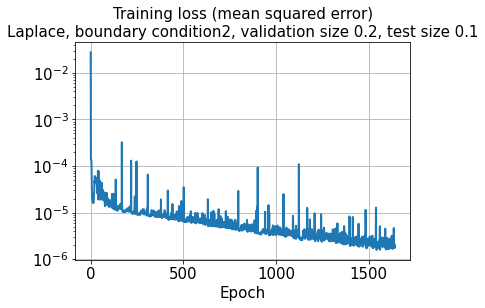

In [33]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.title('Training loss (mean squared error)\nLaplace, boundary condition2, validation size 0.2, test size 0.1', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

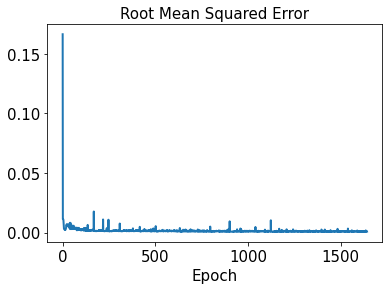

In [34]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

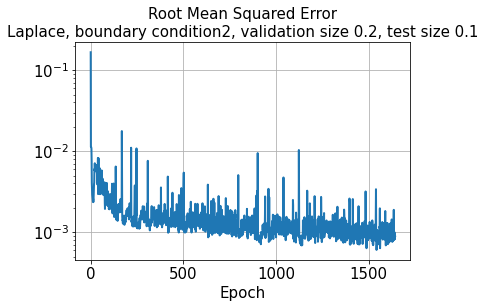

In [35]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error\nLaplace, boundary condition2, validation size 0.2, test size 0.1', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.grid()
plt.show()

In [36]:
#with mirrored_strategy.scope():
test_results = model.evaluate(x_train)

54/54 [==============================] - 0s 3ms/step - loss: 1.2102e-06 - rmse: 0.0000e+00


In [37]:
#with mirrored_strategy.scope():
decoded_train = model.predict(x_train)

54/54 [==============================] - 1s 11ms/step


In [38]:
decoded_val = model.predict(x_val)

6/6 [==============================] - 0s 10ms/step


In [39]:
#with mirrored_strategy.scope():
decoded_test = model.predict(x_test)

7/7 [==============================] - 0s 10ms/step


In [40]:
error_train_abs = np.abs(decoded_train - y_train)

In [41]:
error_val_abs = np.abs(decoded_val - y_val)

In [42]:
error_test_abs = np.abs(decoded_test - y_test)

In [43]:
os.chdir("D:\\TrainedModels\\20221027")
model.save('Laplace_bc2_100kernel_2by2MaxPooling_2CNNlayer_validationSize0.2testSize0.2.h5',
           overwrite=True, include_optimizer=True, save_format='h5')

In [44]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.0008128341577679548


In [45]:
l2_error_val = np.sqrt(np.sum((decoded_val - y_val)**2) / np.sum(y_val**2))
print(l2_error_val)

0.0010458180293546058


In [46]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.0015014023737814695


In [47]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)
print(l2_error_train_list)

[0.0009809171733213104, 0.0013140698037936182, 0.0009970123287968463, 0.0008407692661879119, 0.0008929242450051971, 0.0012647363934903029, 0.000954478407212018, 0.000965314436423816, 0.0009474659063258235, 0.0011111949481390324, 0.0008569981744761372, 0.0009445314899598405, 0.0009329550730962323, 0.0011984738126259505, 0.0012780497706528925, 0.0012334166858065853, 0.0014859502755715892, 0.001471972900708431, 0.001153481087643681, 0.0012211893910415415, 0.001436461997855929, 0.0013465944665965205, 0.0015534331087149775, 0.0014309482404479296, 0.0011268759477579143, 0.0014111317405415887, 0.0013601273708990051, 0.001240543012048588, 0.001357808300392598, 0.00146821803471535, 0.001428739762924801, 0.0014330825606113237, 0.0011809569634521858, 0.0009525430464806258, 0.0009337739668577839, 0.0011938023212871487, 0.0006541241762497081, 0.0007834403045127078, 0.0009807400127063673, 0.000866040933068954, 0.0009944783689998995, 0.0007720588932059091, 0.0010486339181664981, 0.0008324862643658794

In [48]:
l2_error_val_list = []
for i in range(0, len(aa_val)):
    l2_error_val_data = np.sqrt(np.sum((decoded_val[i] - y_val[i])**2) / np.sum(y_val[i]**2))
    l2_error_val_list.append(l2_error_val_data)
print(l2_error_val_list)

[0.0007697036375861967, 0.0006677163350055769, 0.0007383408314047225, 0.0006350076574545865, 0.0007148746515435804, 0.000728803887041135, 0.0006401899741398036, 0.0006750893851507841, 0.0007247211211808575, 0.0005689026598212532, 0.0005732747620002972, 0.0006227622163220328, 0.0006955740633787057, 0.0008400945607086077, 0.0006657693648881942, 0.0006592798722130473, 0.0005834384701058073, 0.001085962434861468, 0.0007275240244429951, 0.0006946598033970893, 0.0006473353782799203, 0.0007730315932458826, 0.0005847826201237636, 0.0005900752024244482, 0.0005800087222641656, 0.0005452142479323288, 0.0006314916730342413, 0.0005937523865552043, 0.0006396887000082159, 0.0005844525556110552, 0.000569214835590106, 0.0007692329416589183, 0.0014025592389969566, 0.0015951145786629354, 0.001568011166110058, 0.0013722012515603734, 0.001184906576130342, 0.0008628858847916521, 0.0013465234992475292, 0.0013796205480545447, 0.0014512345772008518, 0.0012169960088201893, 0.0011810052817509552, 0.0010415373629

In [49]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)
print(l2_error_test_list)

[0.0007474879347987112, 0.0006909731471395253, 0.0006380501518153768, 0.0007138733620420284, 0.0005909042158089796, 0.0007357490959786783, 0.0006646464126274826, 0.0006160669253111346, 0.0007890873170136967, 0.0007230580597895773, 0.0006856887374223559, 0.0006001905246168078, 0.0008520096159345196, 0.0007916135574728148, 0.0009201033719484606, 0.000941232065508439, 0.0009632945073072364, 0.0009717610513615745, 0.0009192499410825268, 0.0007746890679877696, 0.0007442310710905254, 0.0006190534243497206, 0.0007235610002168583, 0.0008196017206523938, 0.000887078372043984, 0.0008354548819952937, 0.0007687179222206364, 0.0008652154769941316, 0.0008037620154927123, 0.0008309049909183927, 0.0009514643971666909, 0.0008699682393828377, 0.0012614897015486026, 0.0010374331108887814, 0.001475257169590892, 0.0009012430984276088, 0.0007593016395502947, 0.0008642289489667832, 0.001147008903497063, 0.0010710992798681838, 0.0008942352713580493, 0.0010034129689515847, 0.0010730858062426322, 0.001060710513

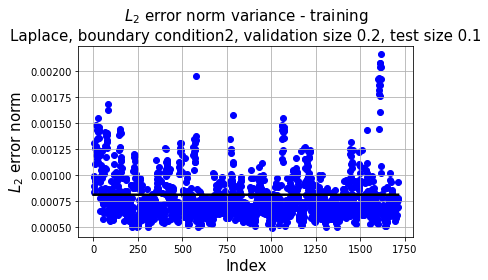

In [59]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance - training\nLaplace, boundary condition2, validation size 0.2, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

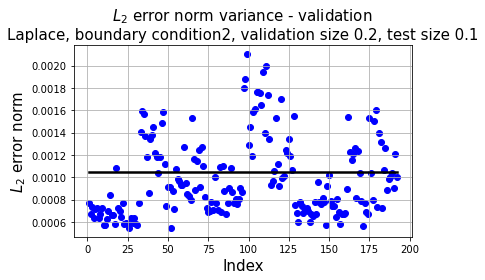

In [58]:
plt.plot(np.linspace(1, aa_val.shape[0], aa_val.shape[0]),
         l2_error_val*np.ones(aa_val.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_val.shape[0], aa_val.shape[0]), l2_error_val_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance - validation \nLaplace, boundary condition2, validation size 0.2, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

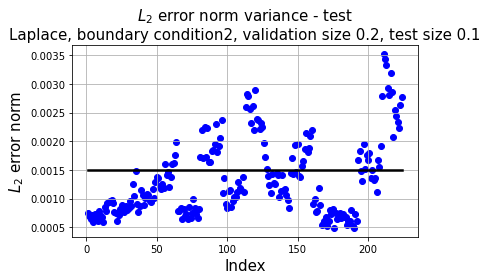

In [57]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance - test\nLaplace, boundary condition2, validation size 0.2, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

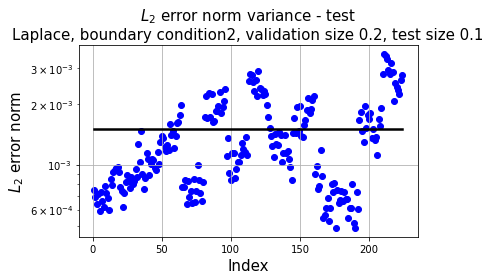

In [53]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - test\nLaplace, boundary condition2, validation size 0.2, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

In [60]:
os.chdir("D:\\CNN_poisson_files\\images\\LaplaceValidationSize0.2testSize0.1")

In [61]:
n_grid=101

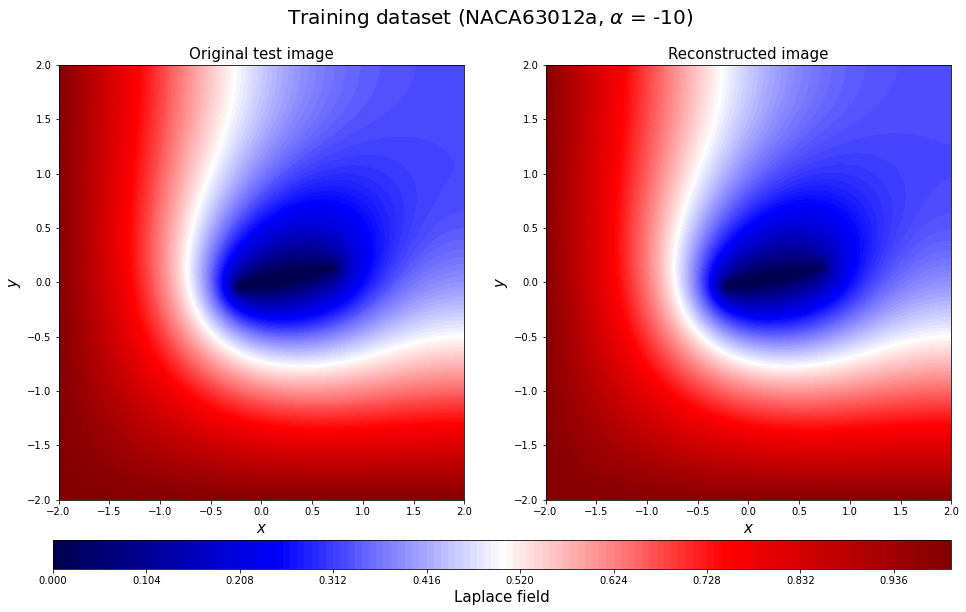

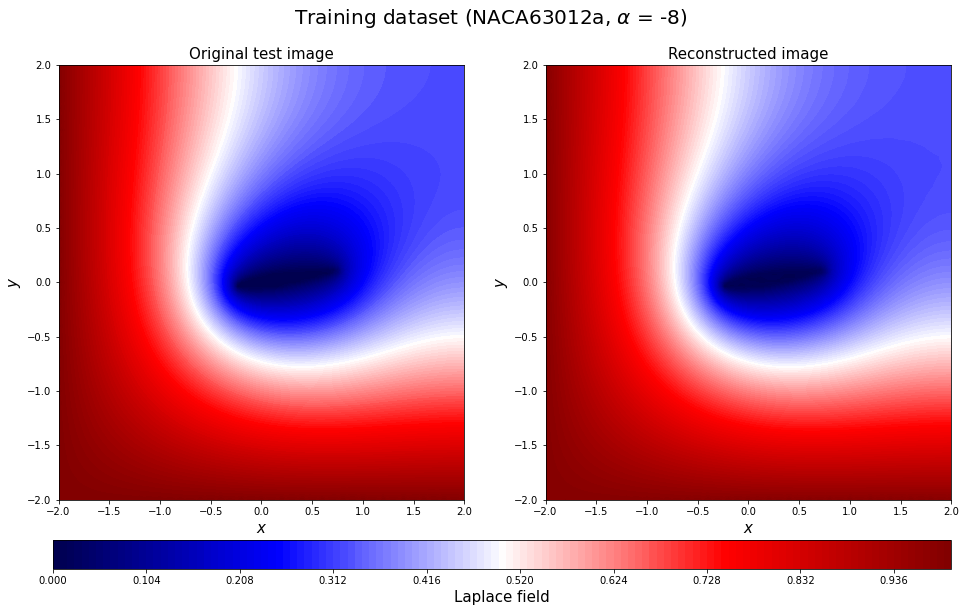

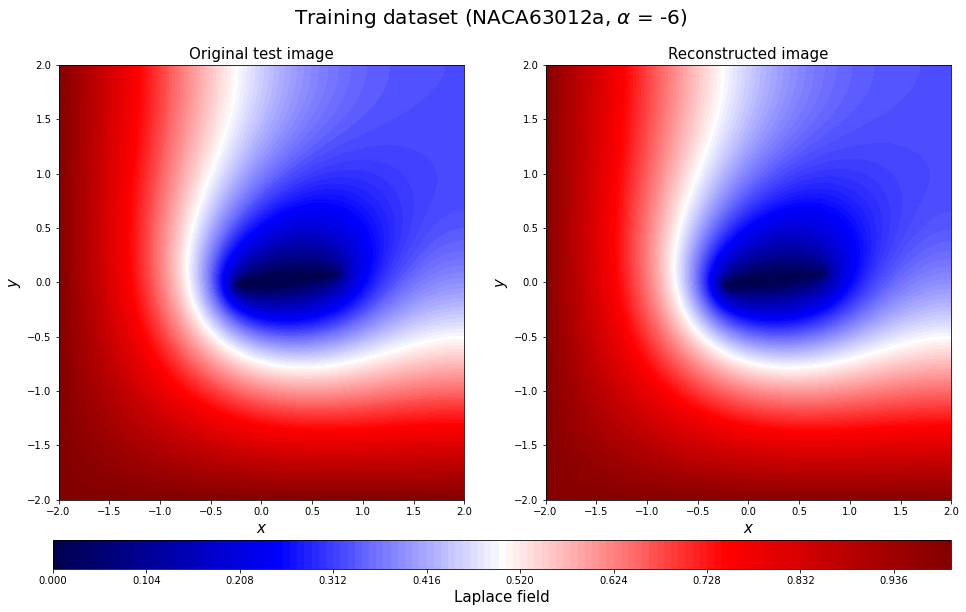

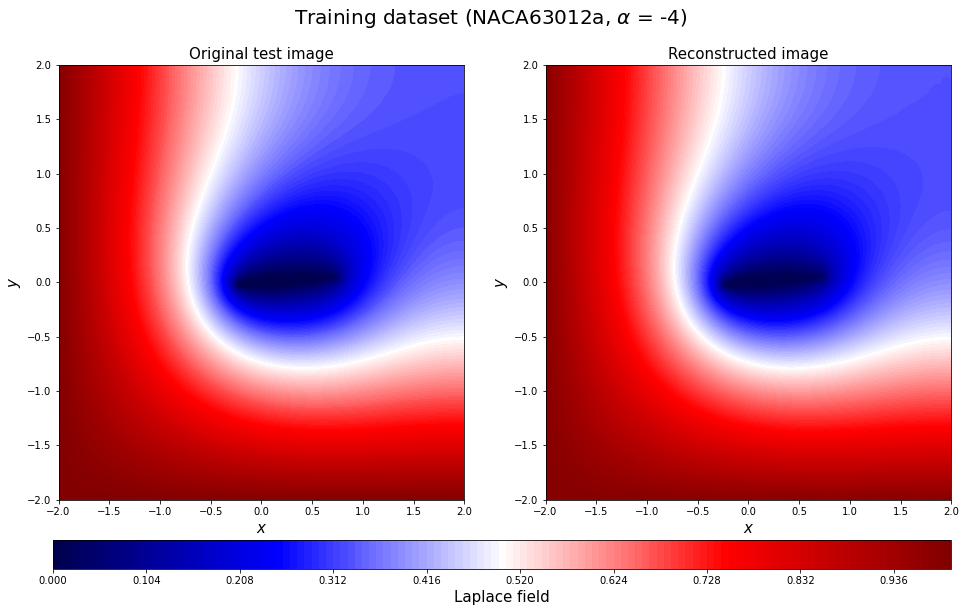

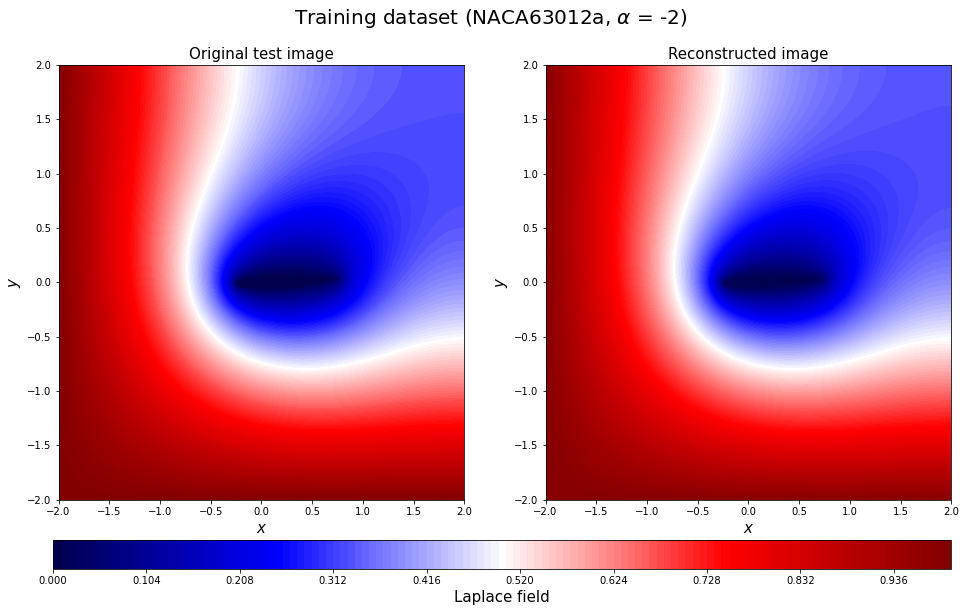

...

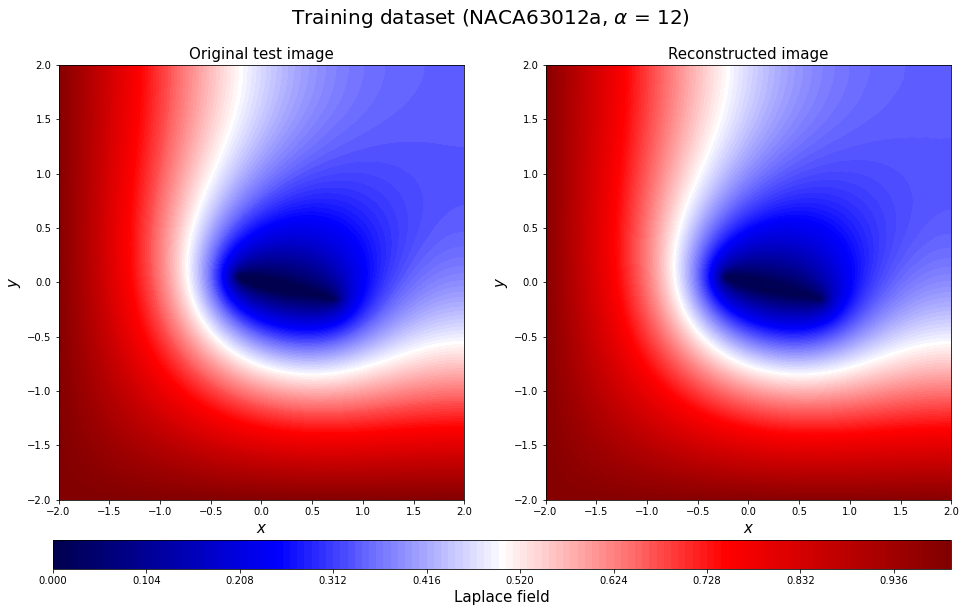

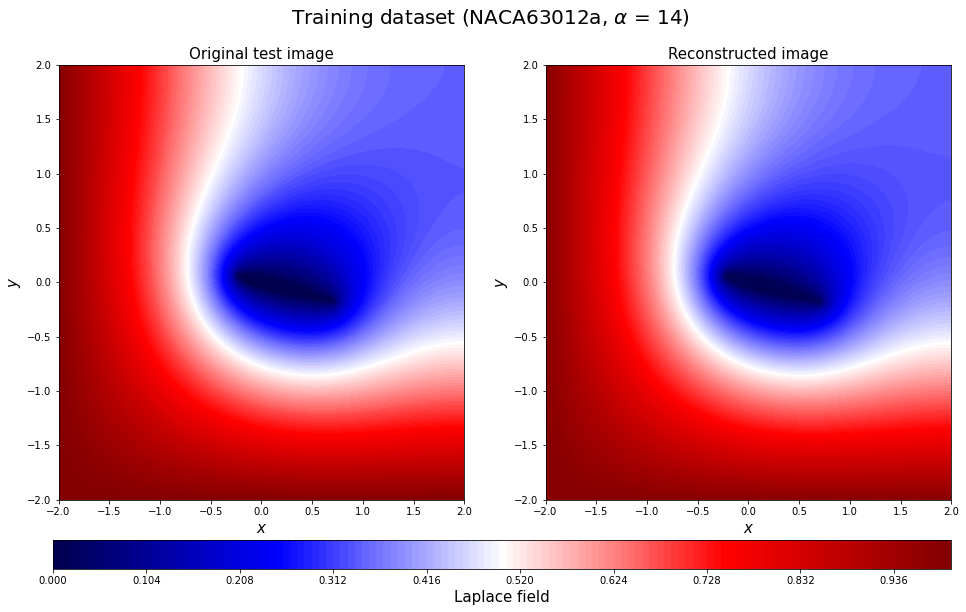

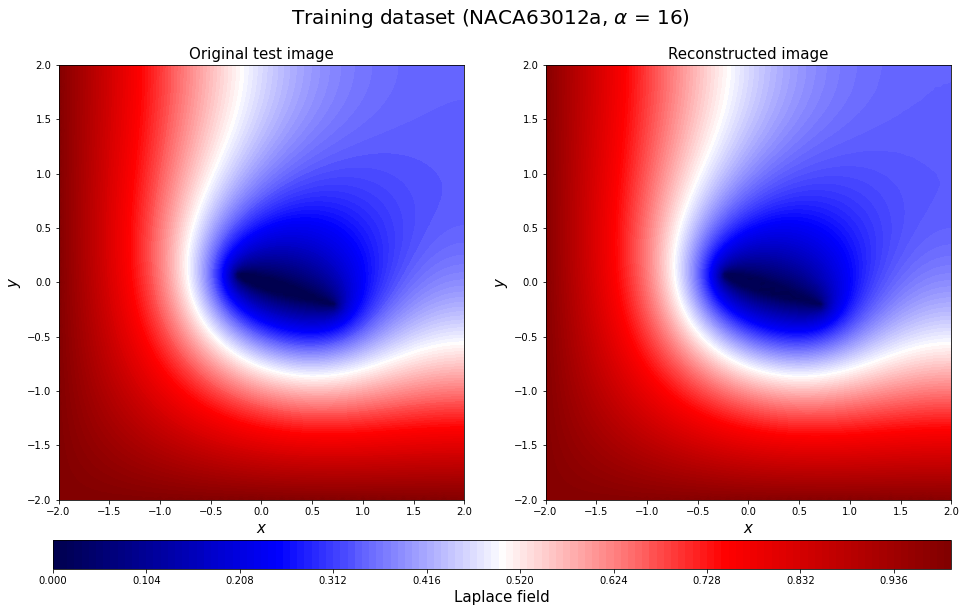

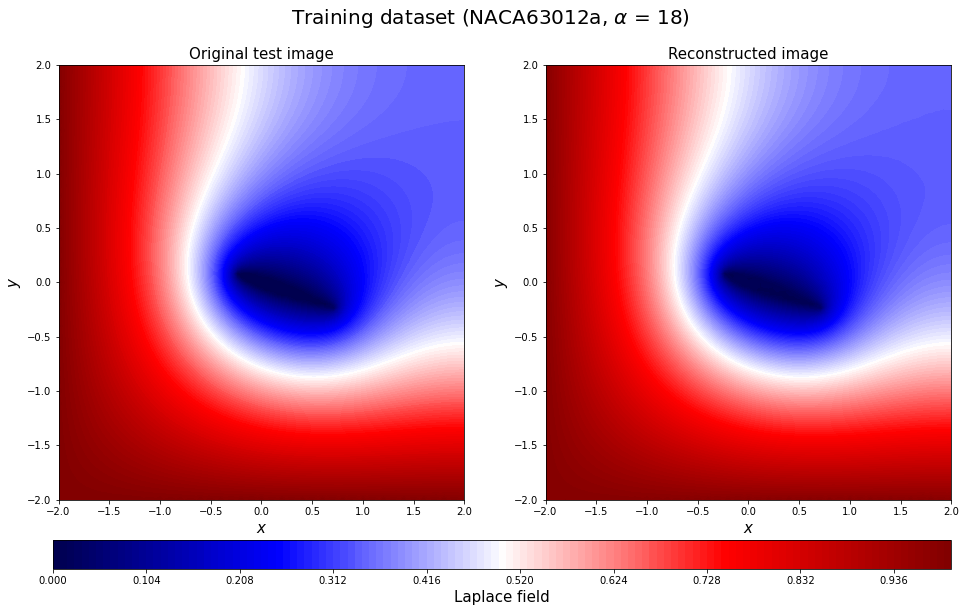

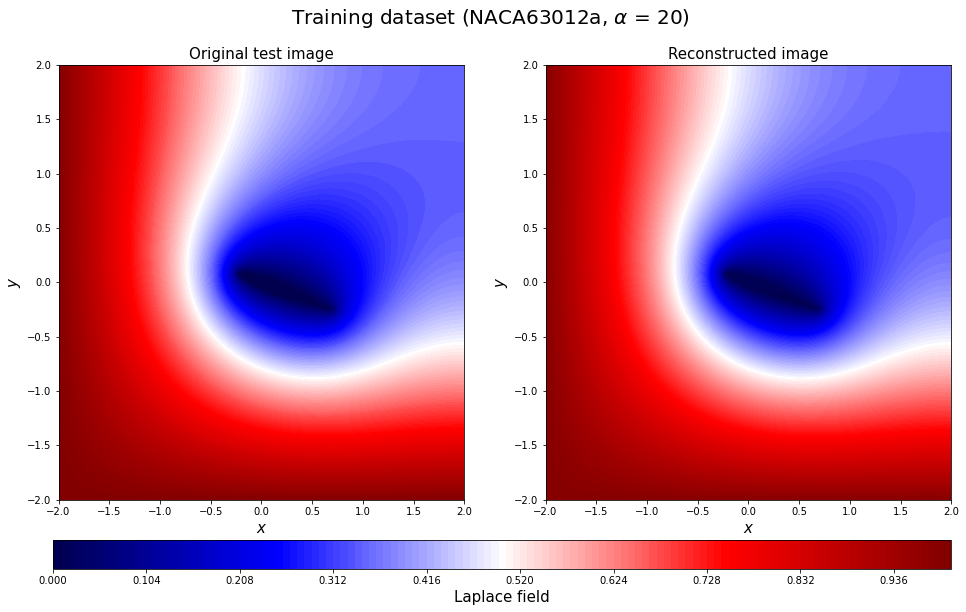

In [62]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate,levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Laplace field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Laplace_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

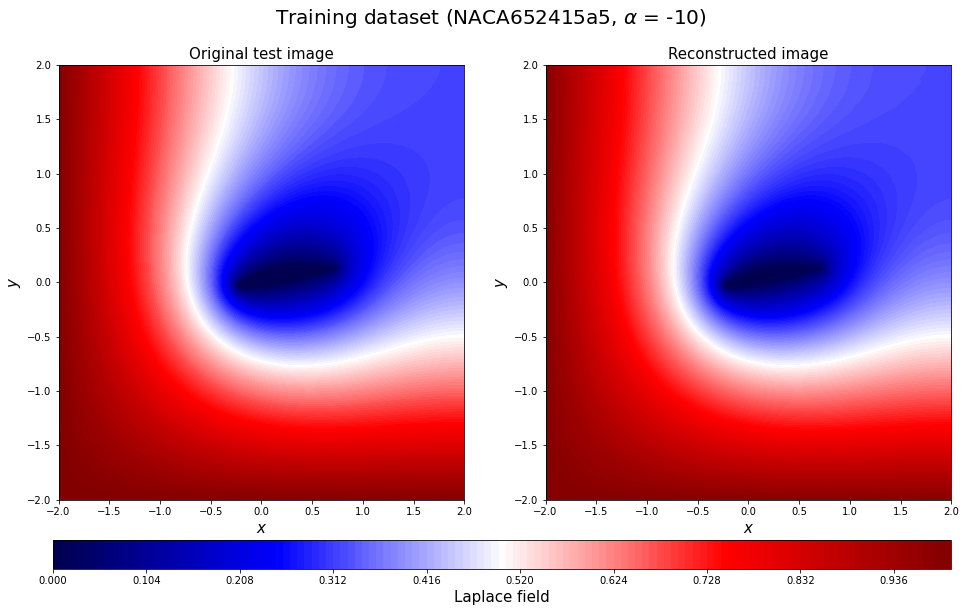

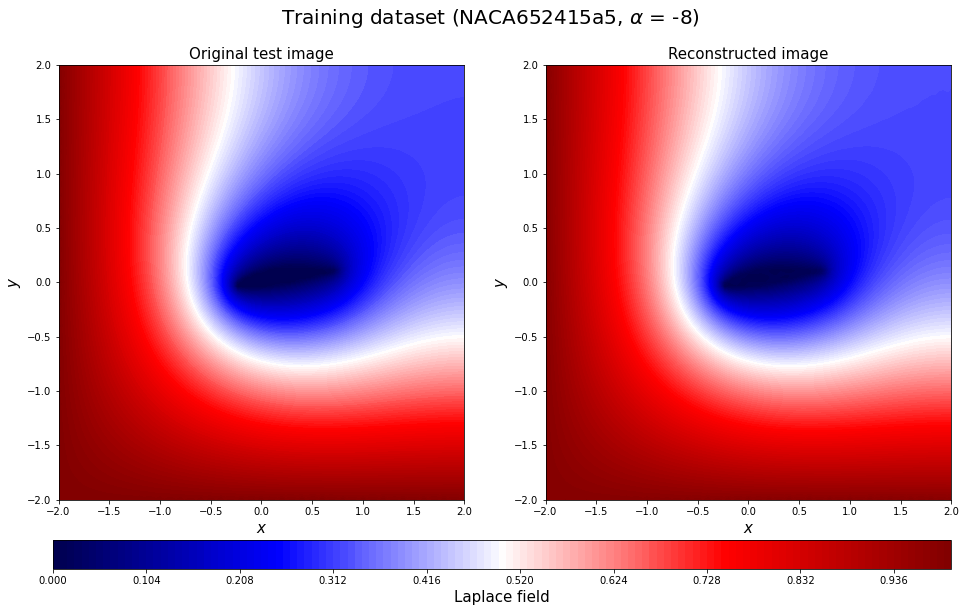

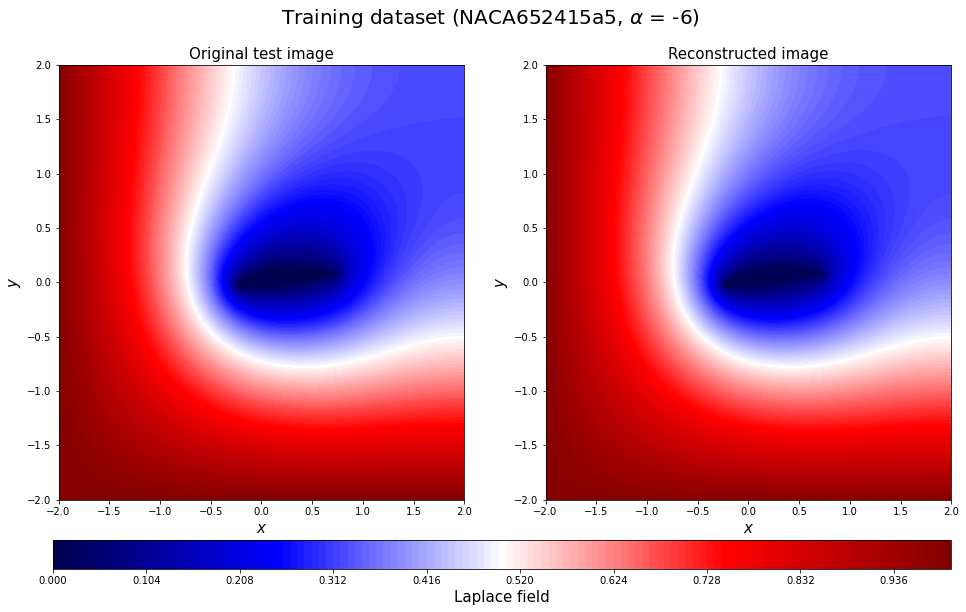

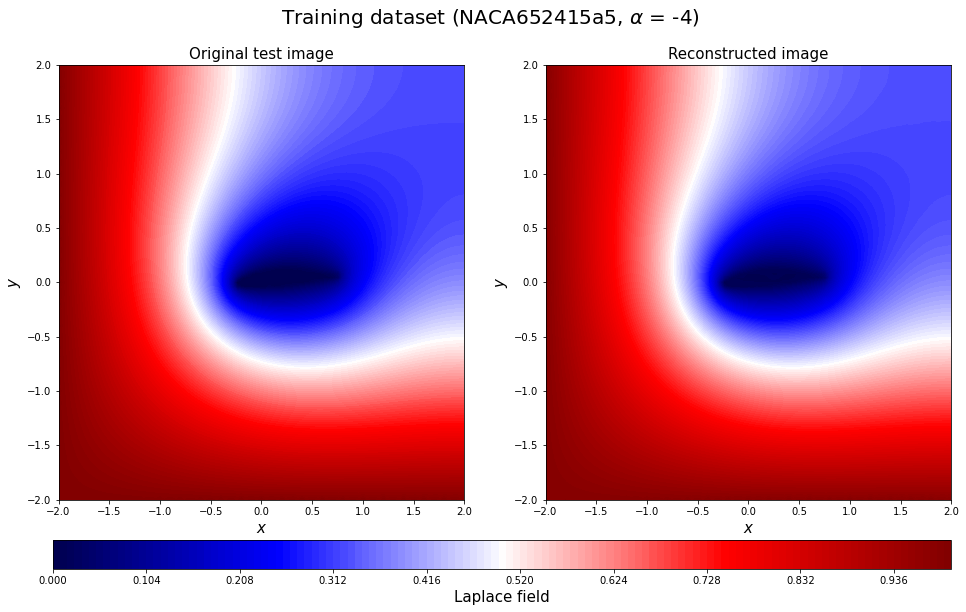

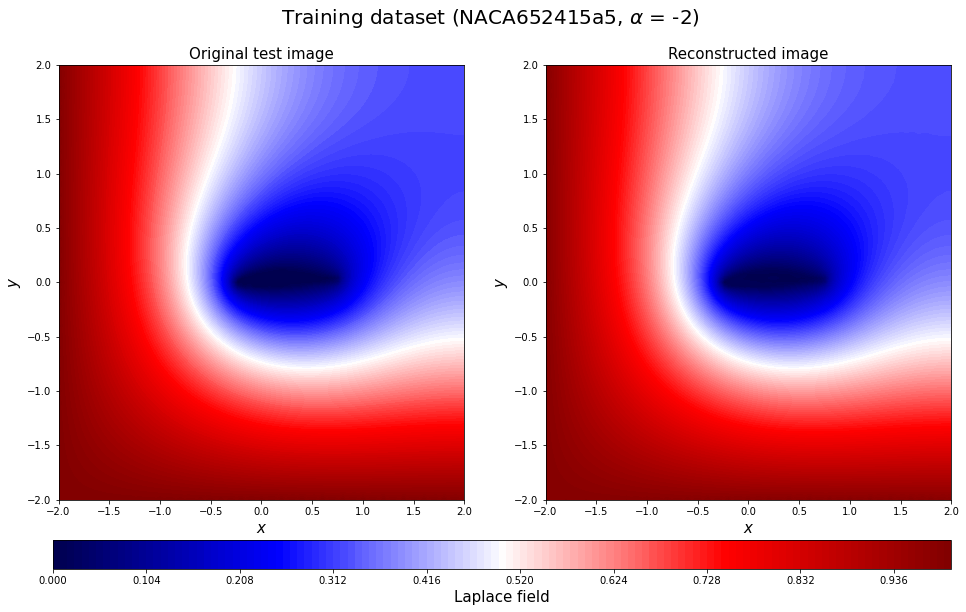

...

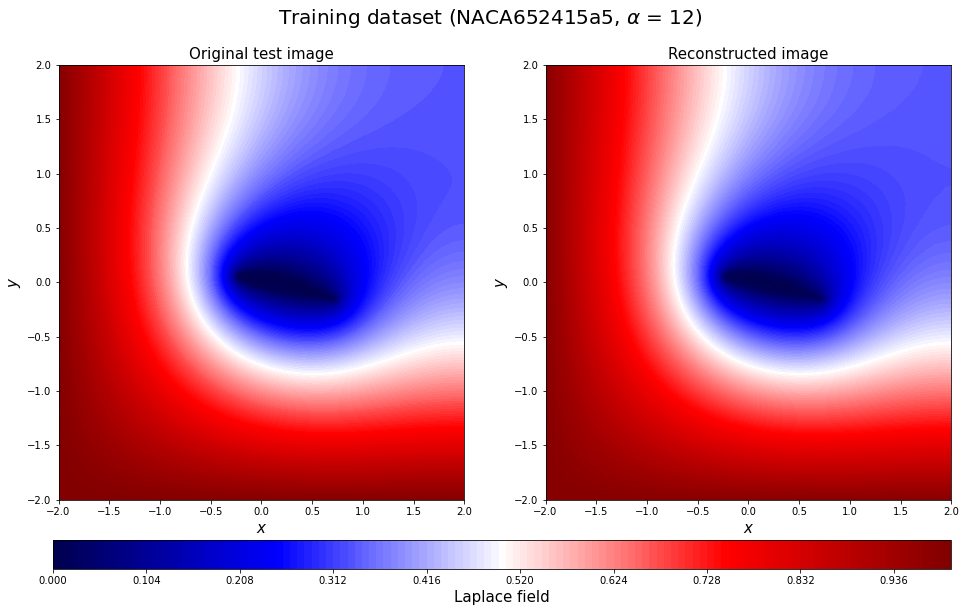

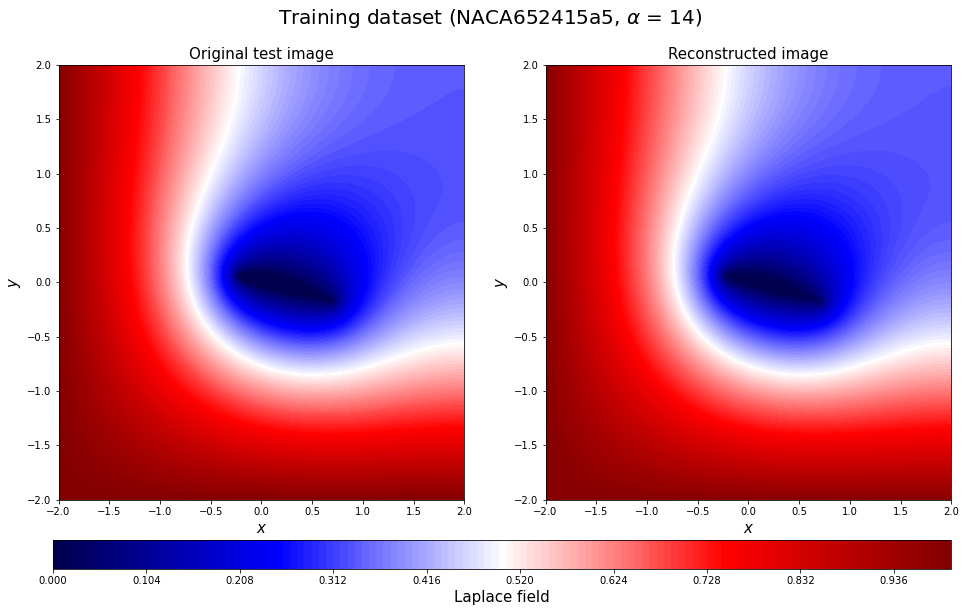

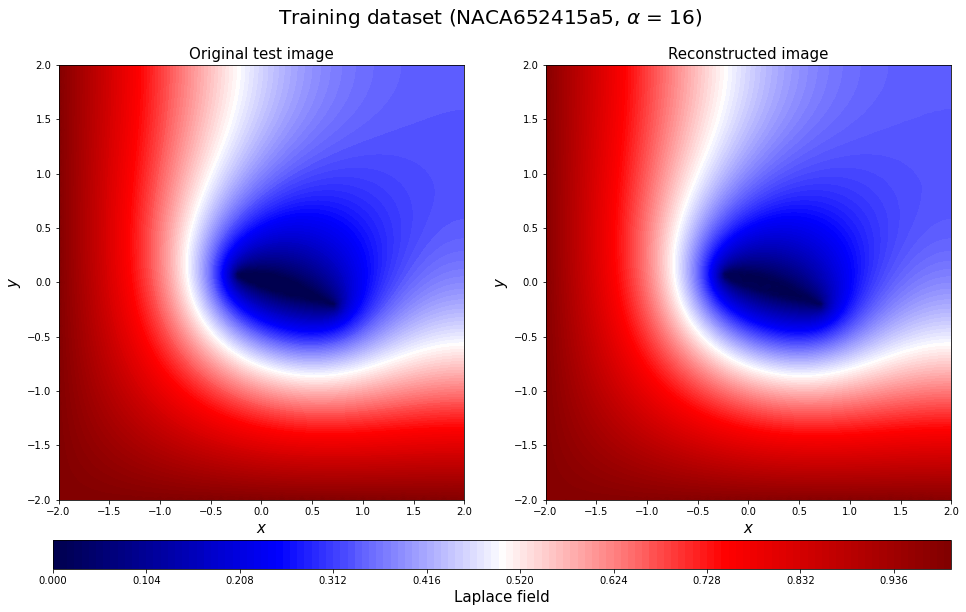

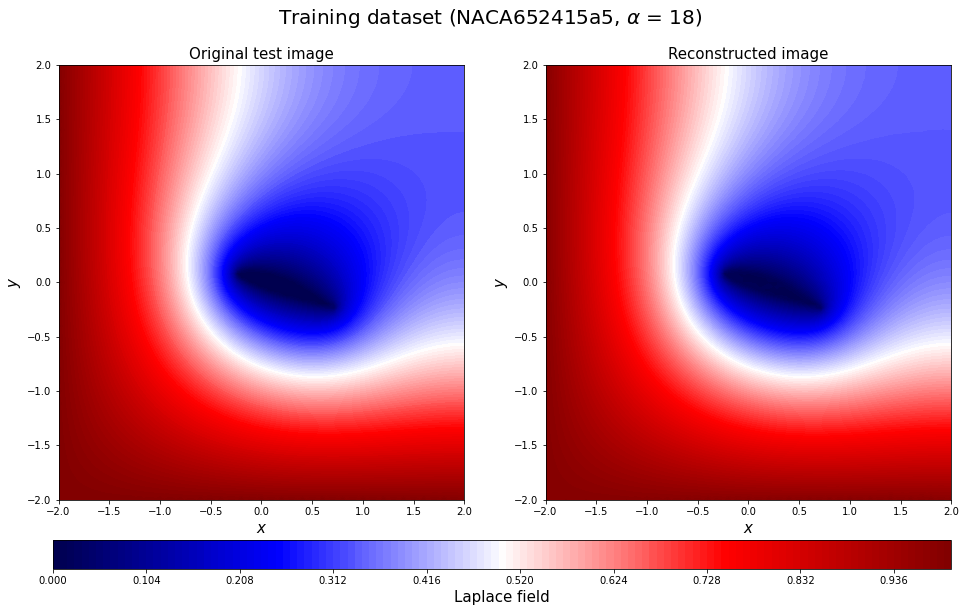

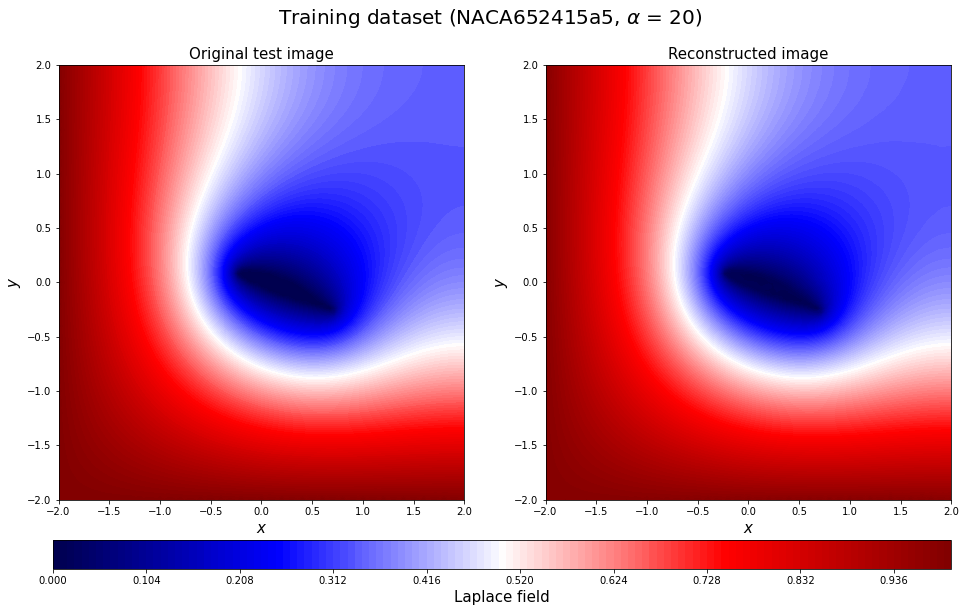

In [63]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Laplace field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221027Prediction_Laplace_bc2(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

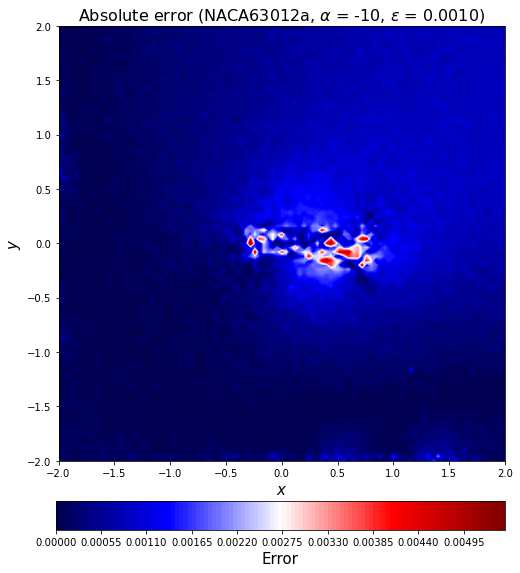

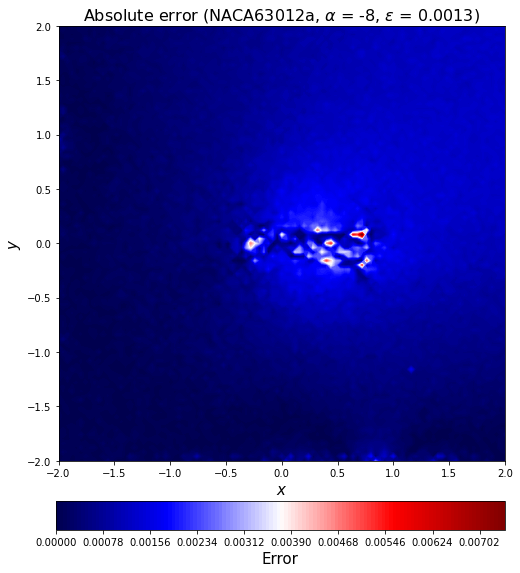

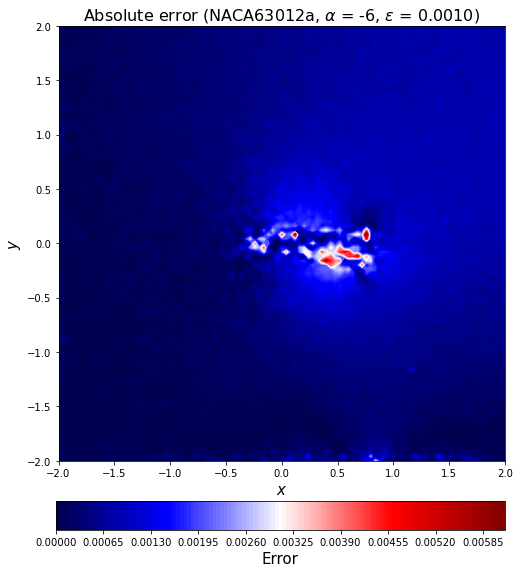

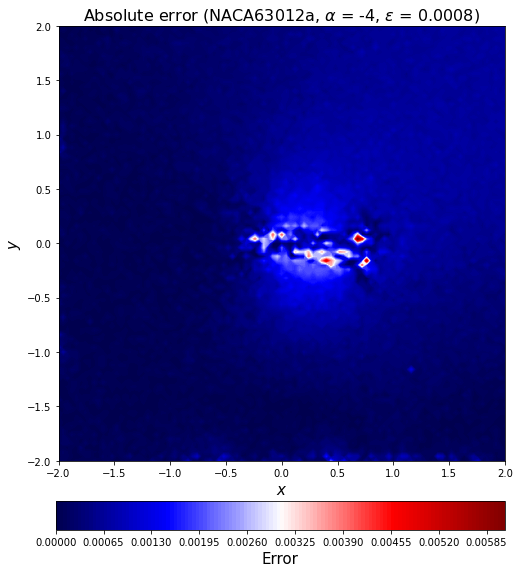

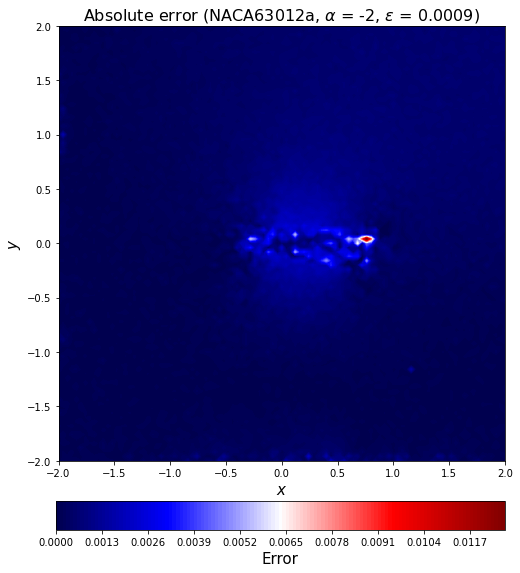

...

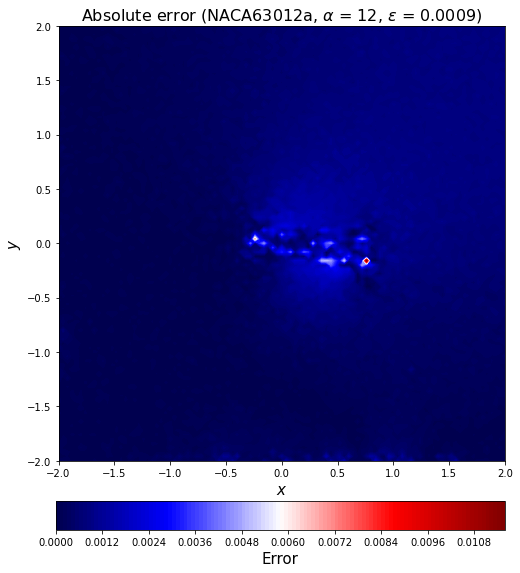

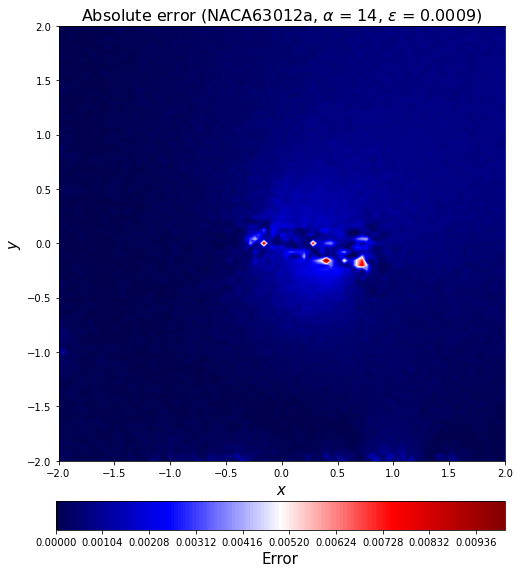

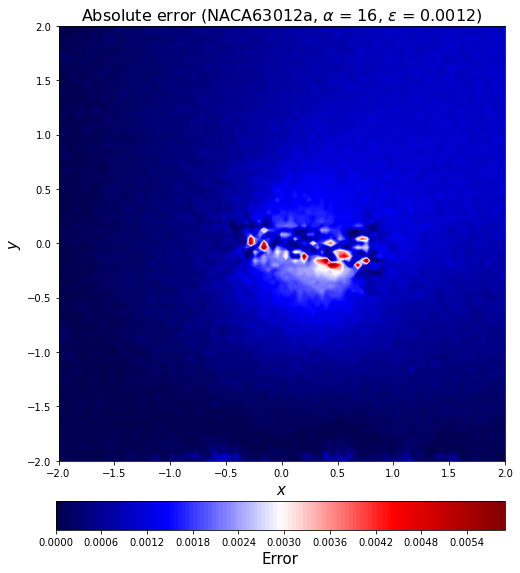

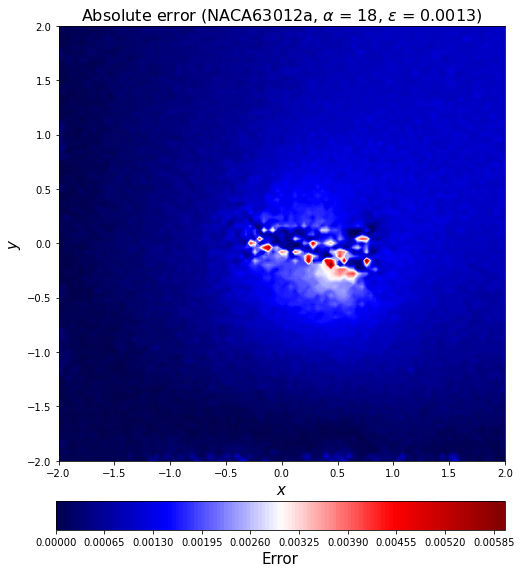

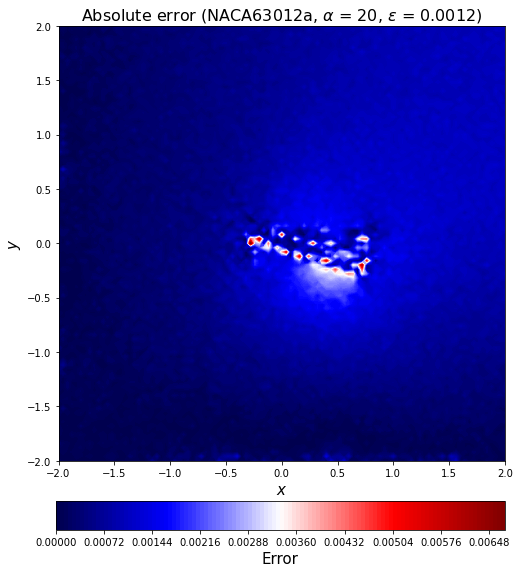

In [64]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Laplace_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

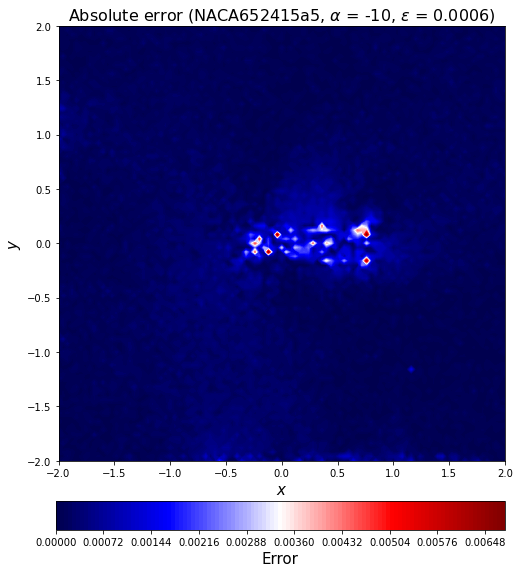

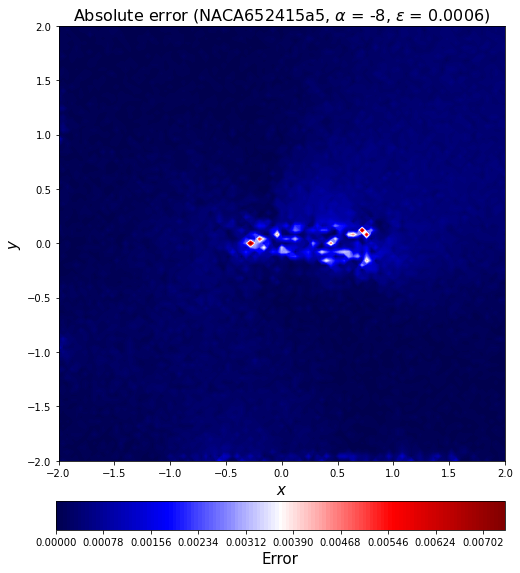

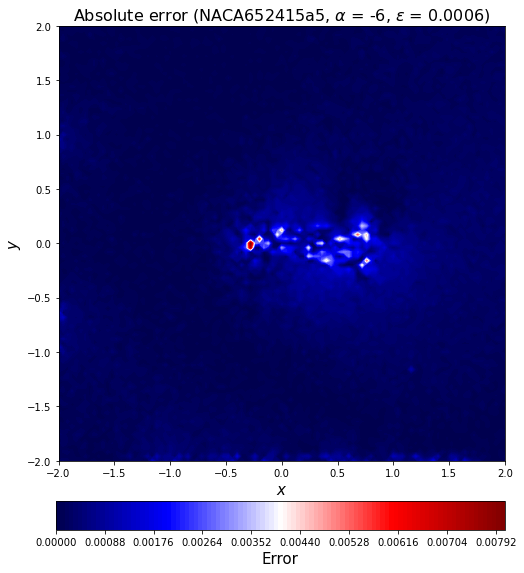

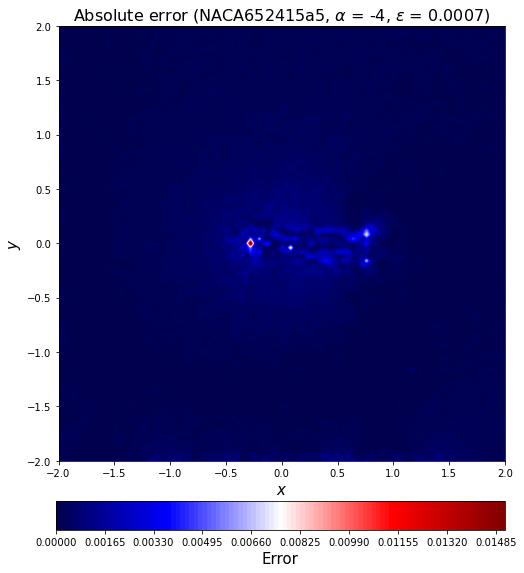

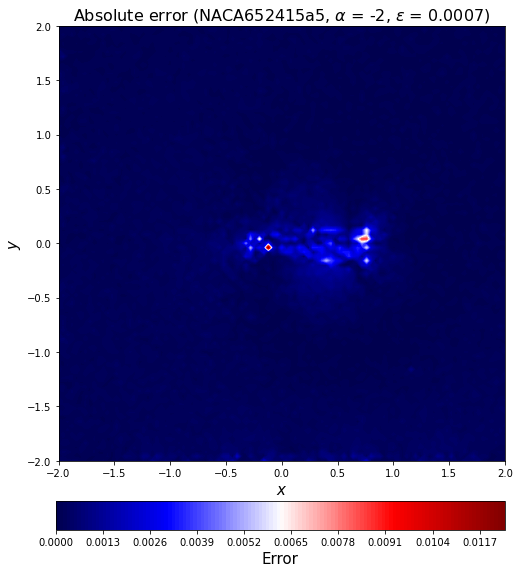

...

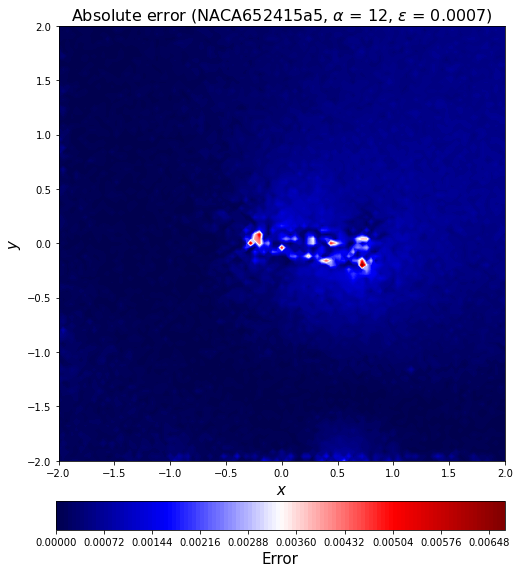

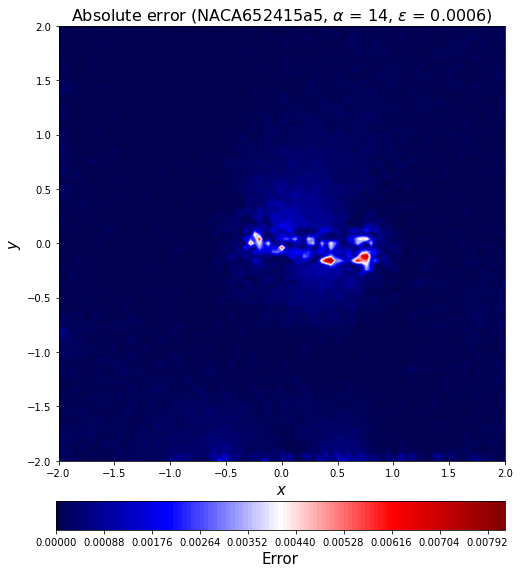

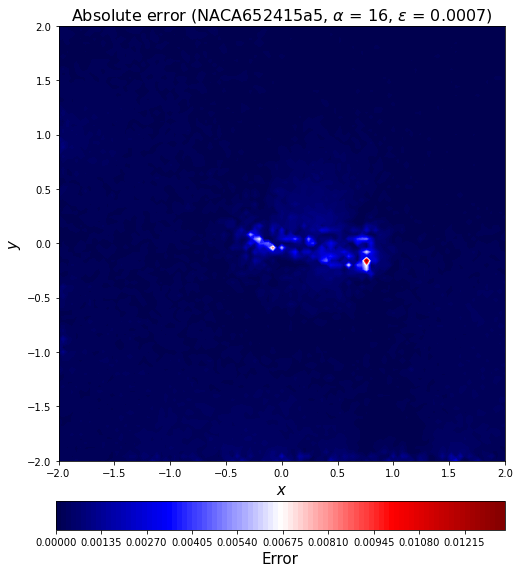

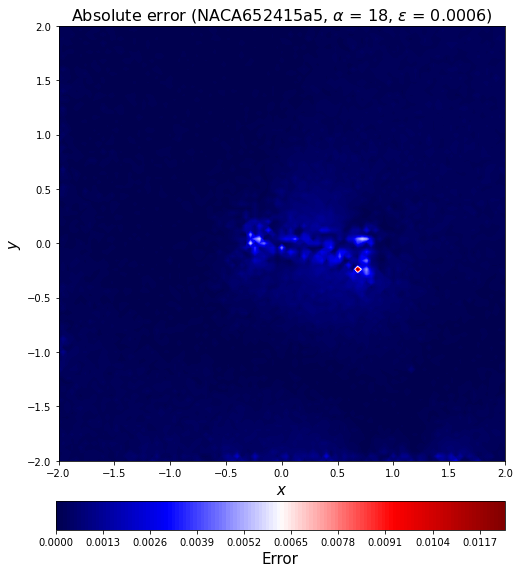

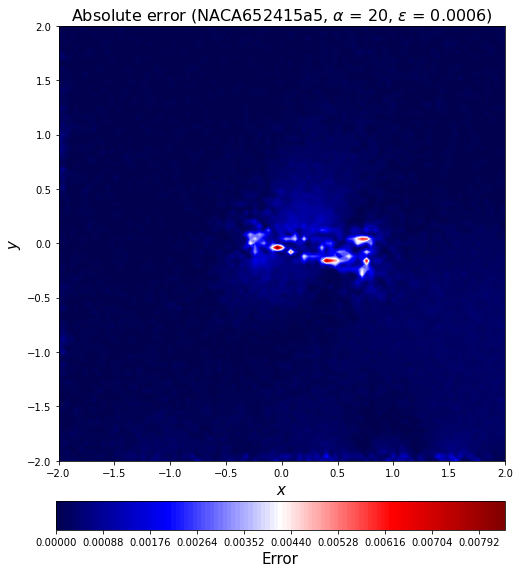

In [65]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[16*20+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Laplace_bc2(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

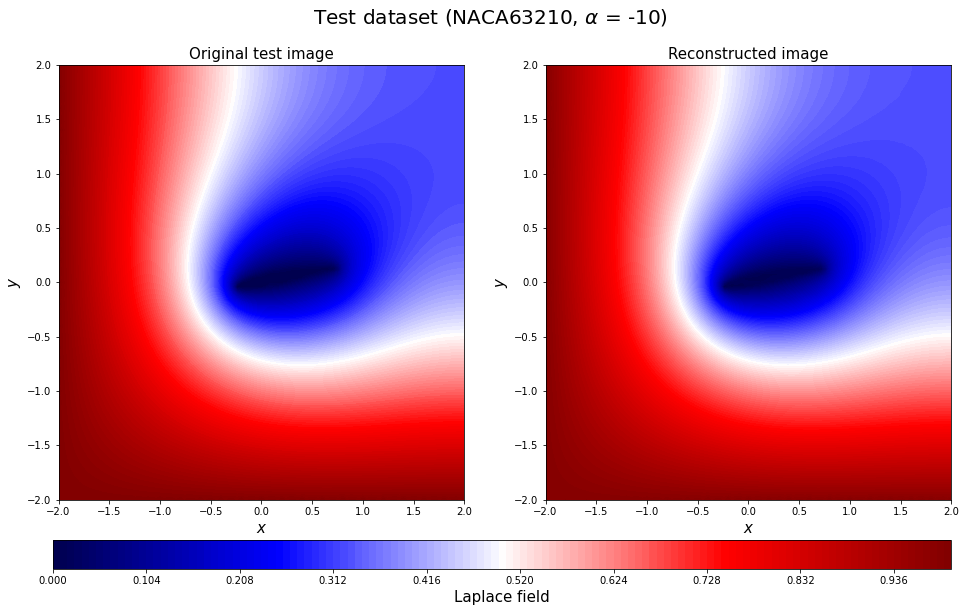

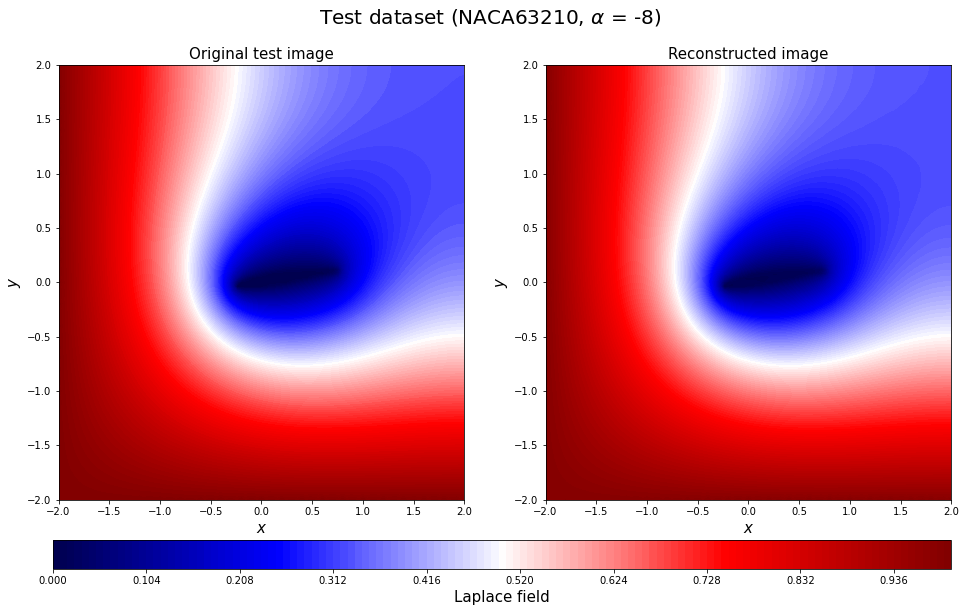

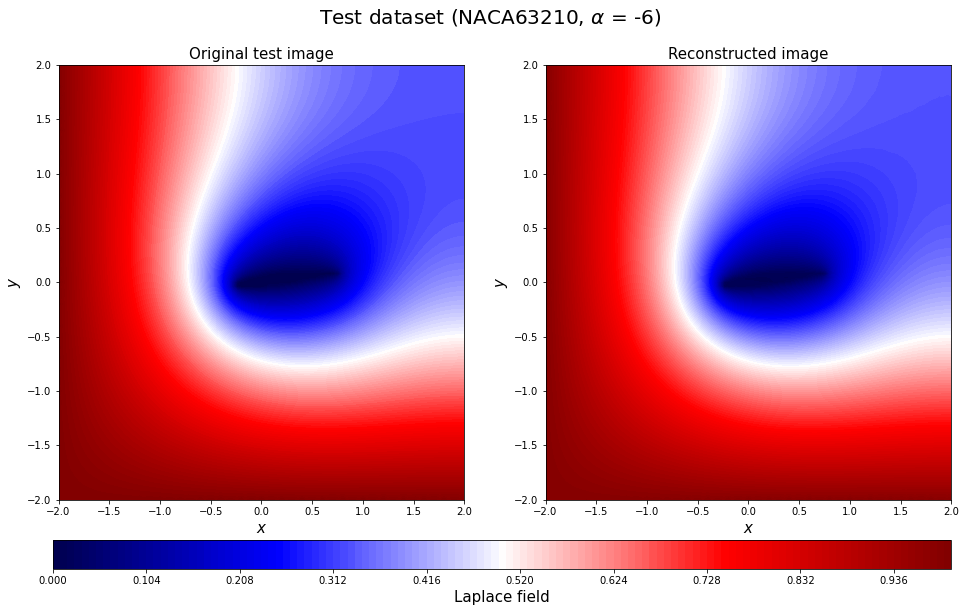

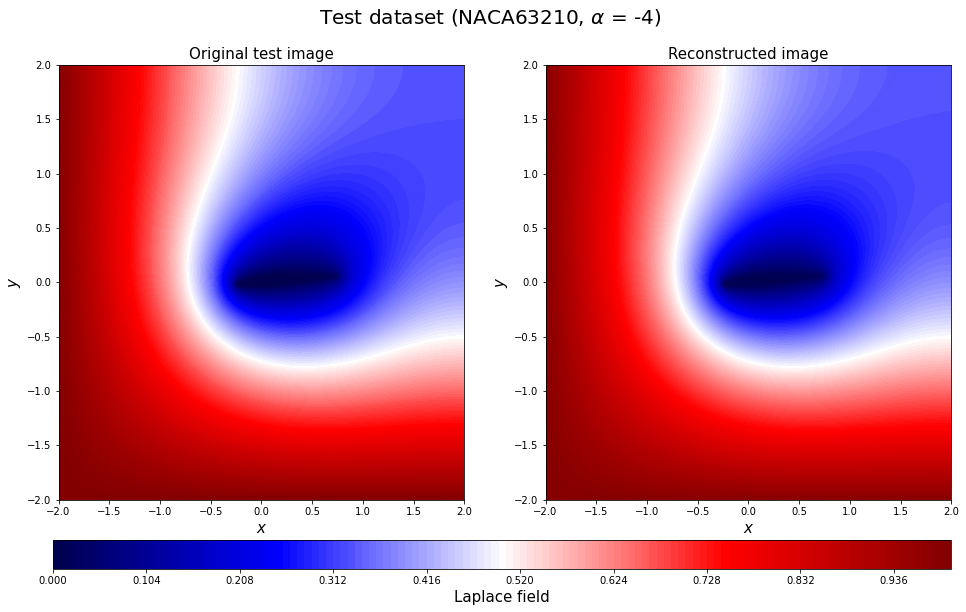

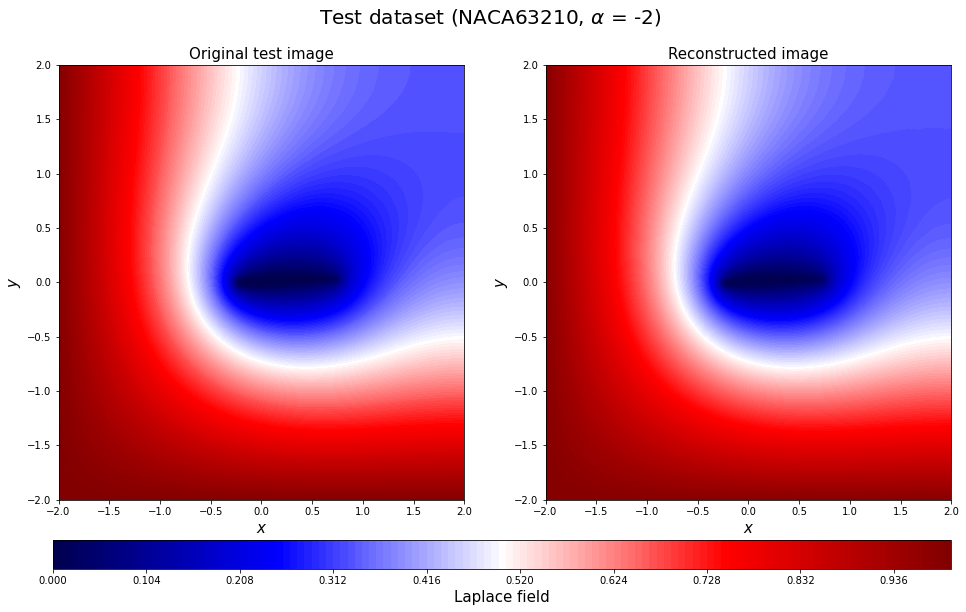

...

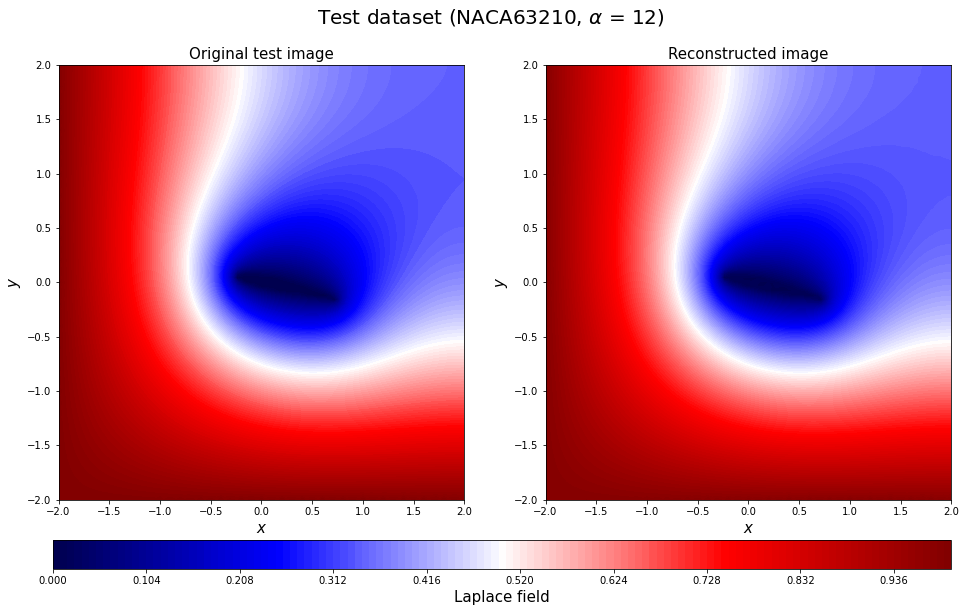

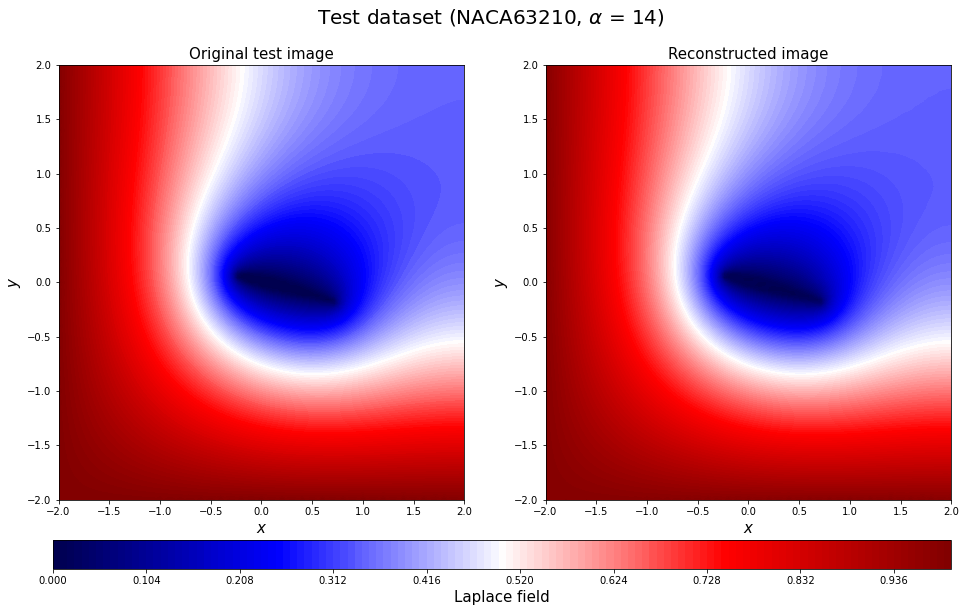

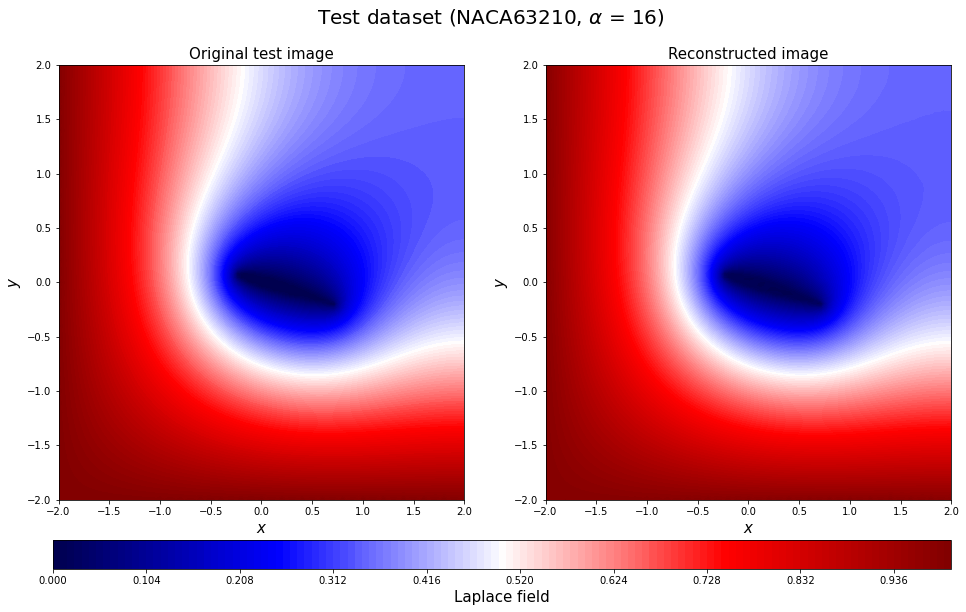

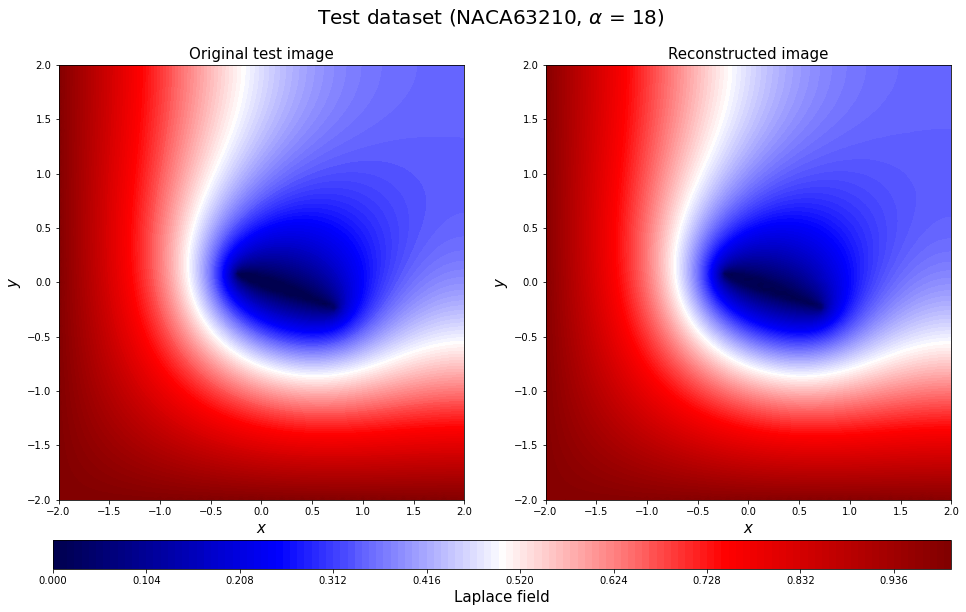

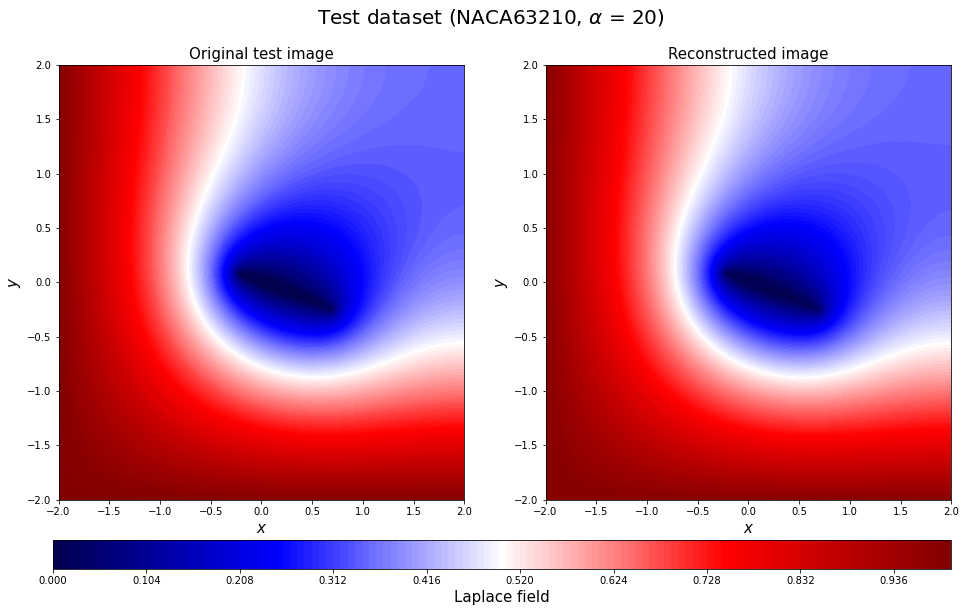

In [66]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Laplace field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221027Prediction_Laplace_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

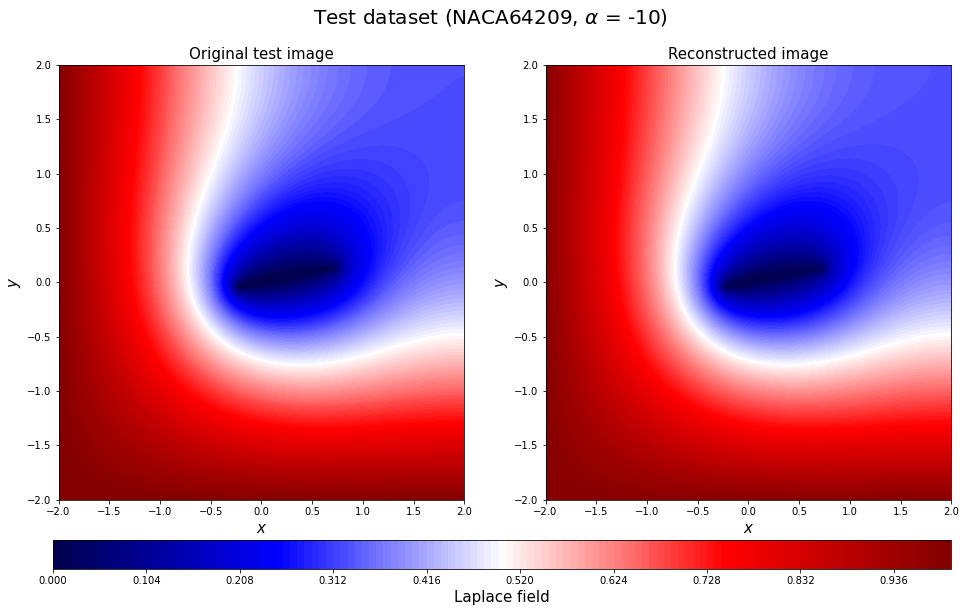

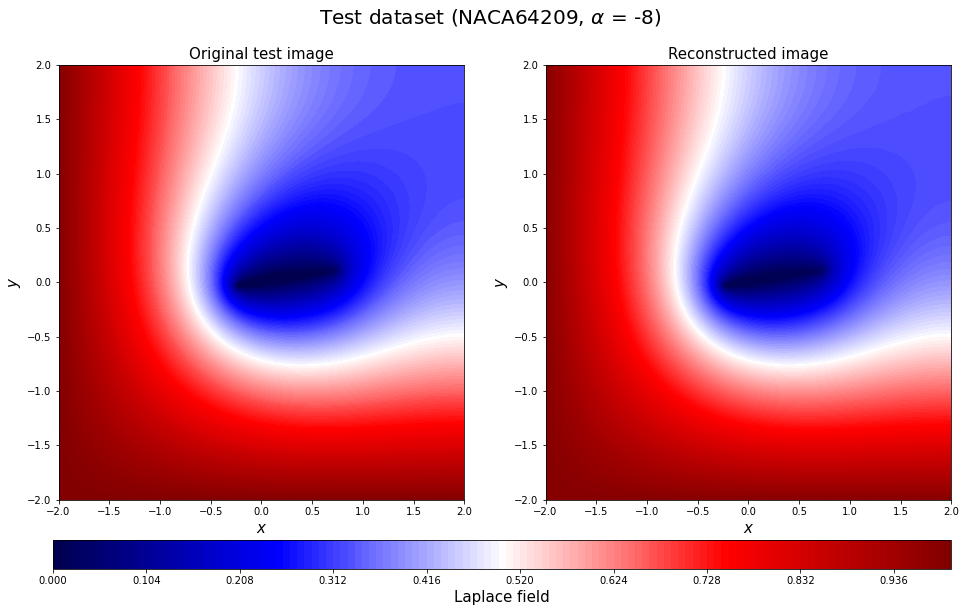

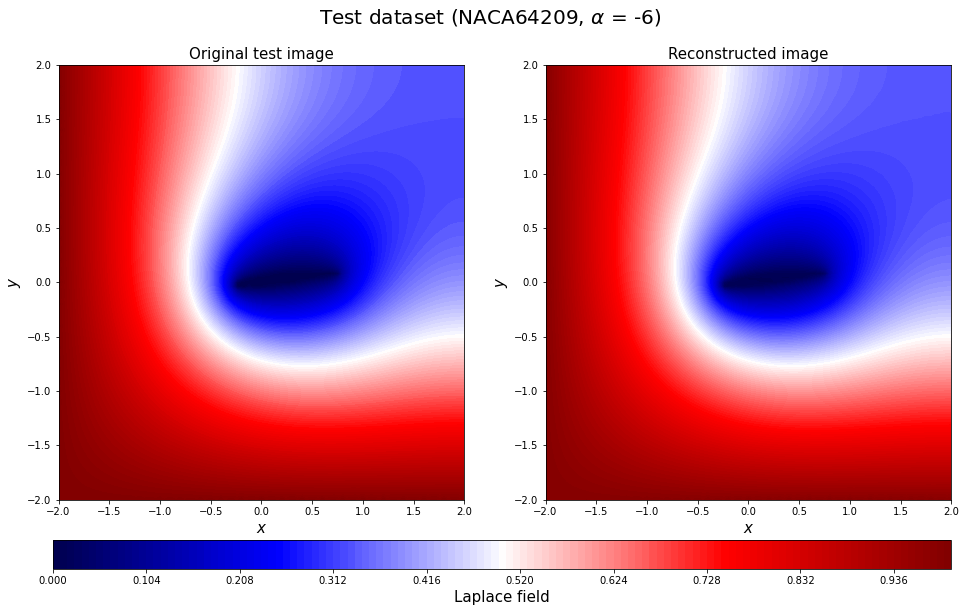

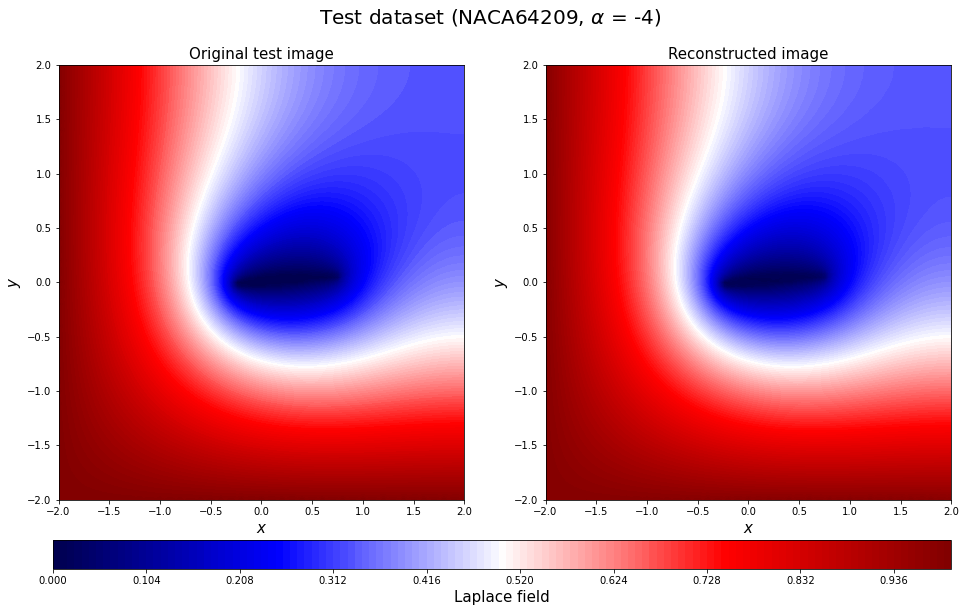

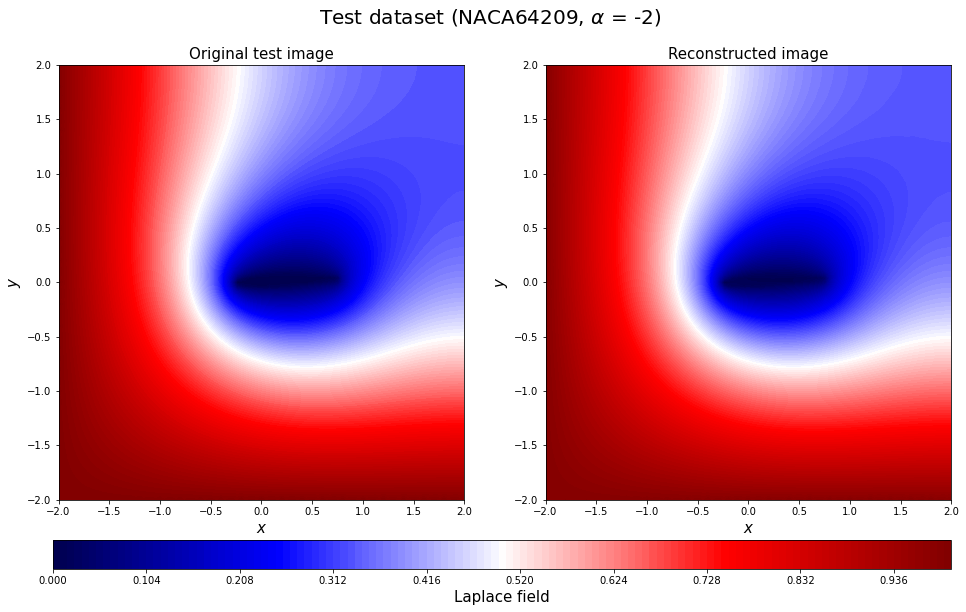

...

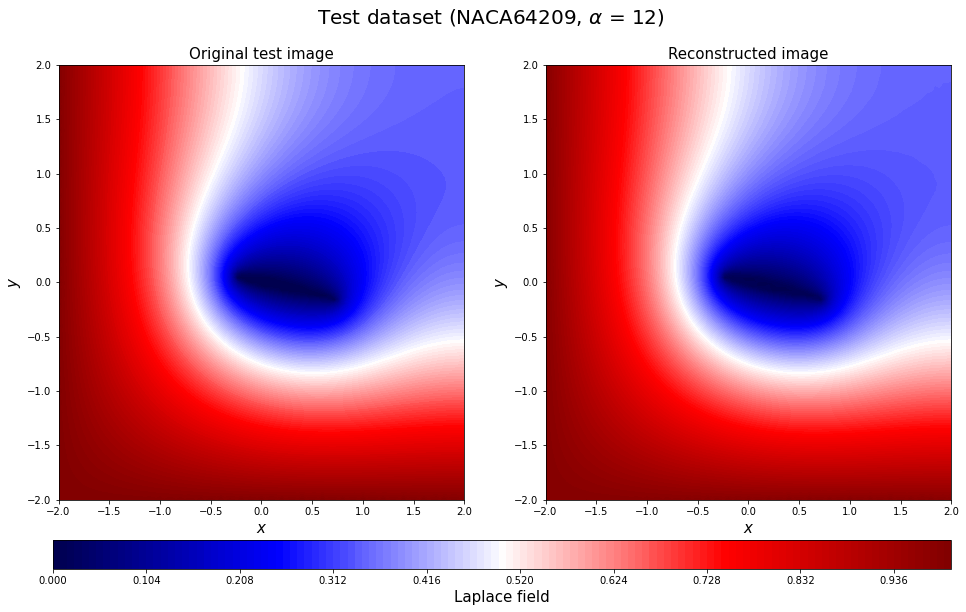

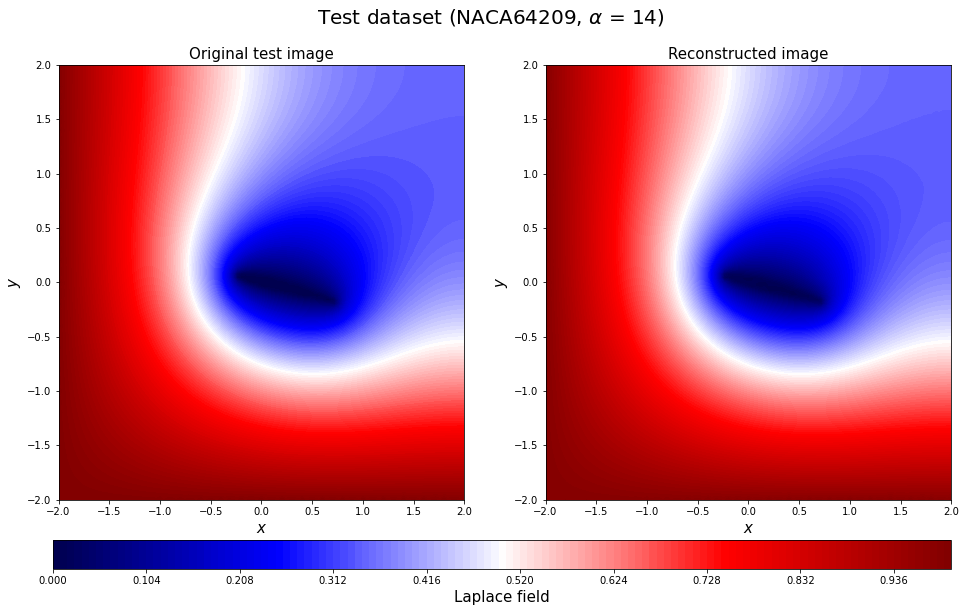

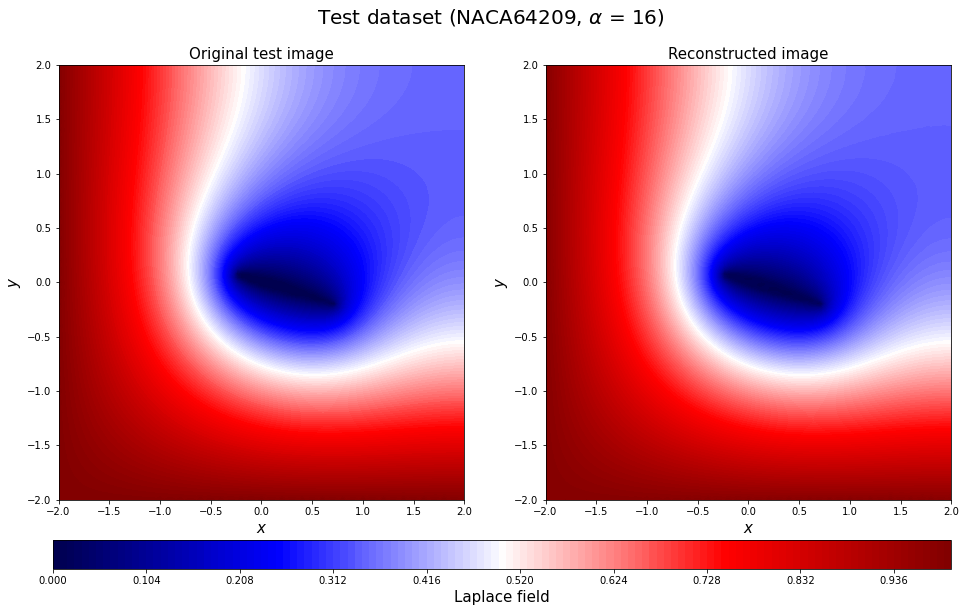

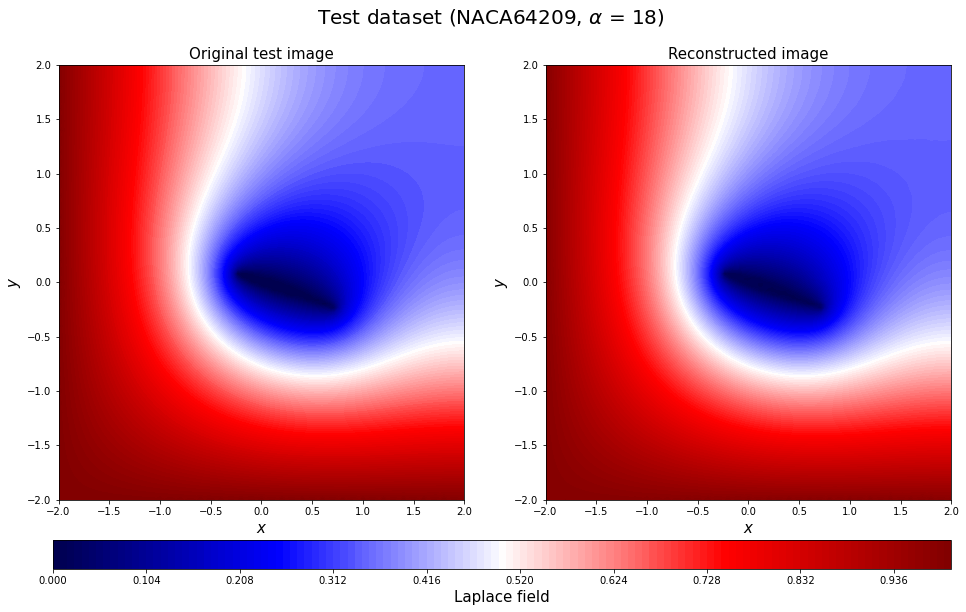

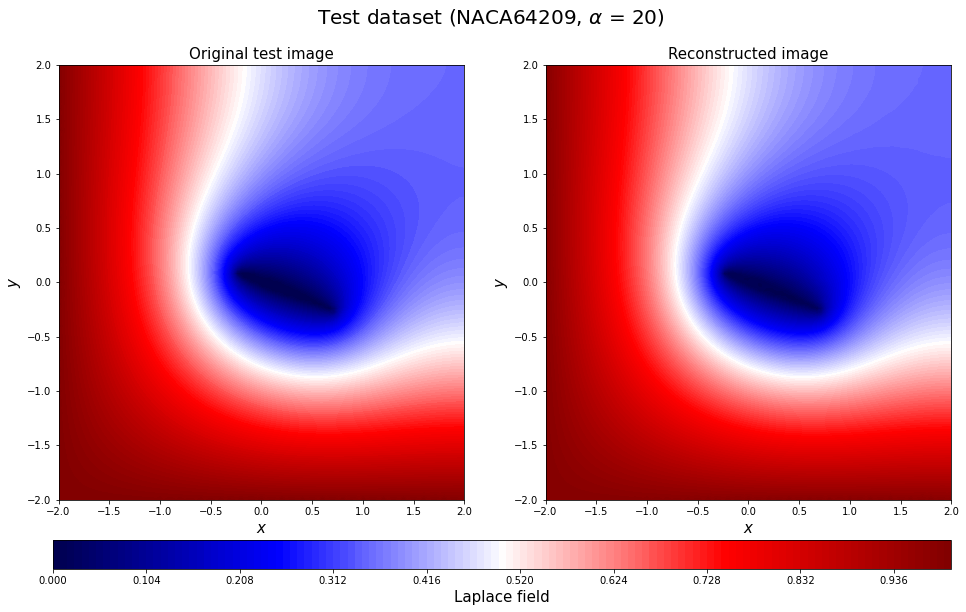

In [67]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Laplace field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Laplace_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

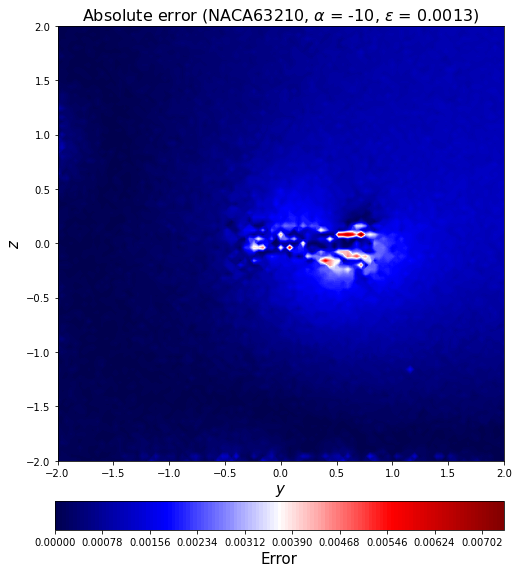

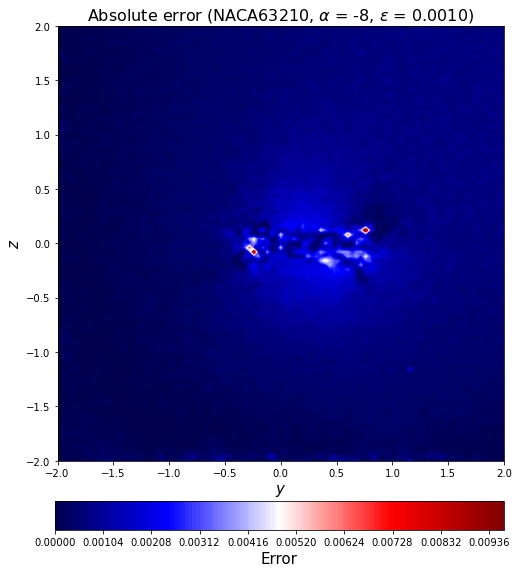

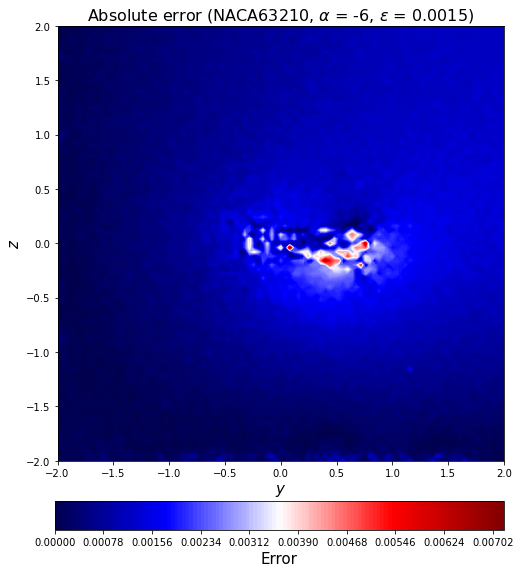

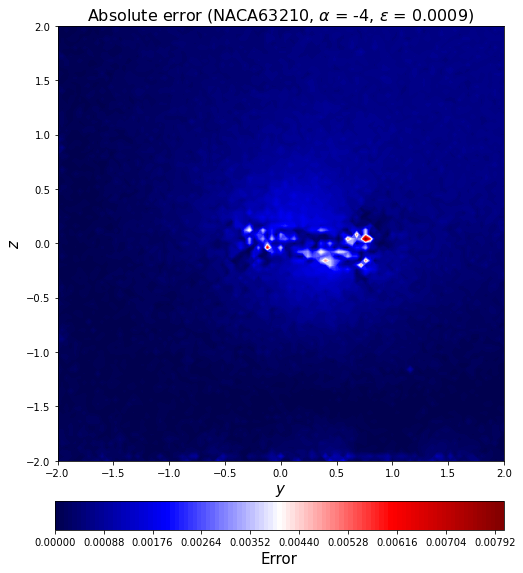

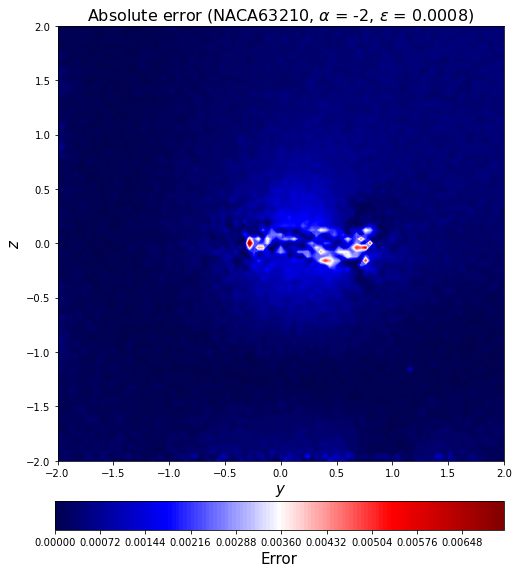

...

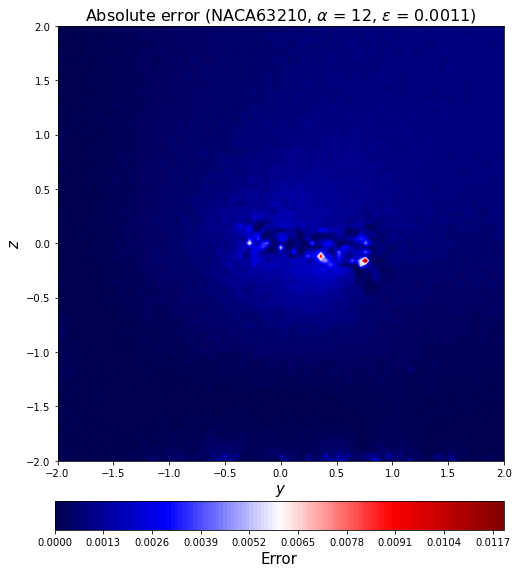

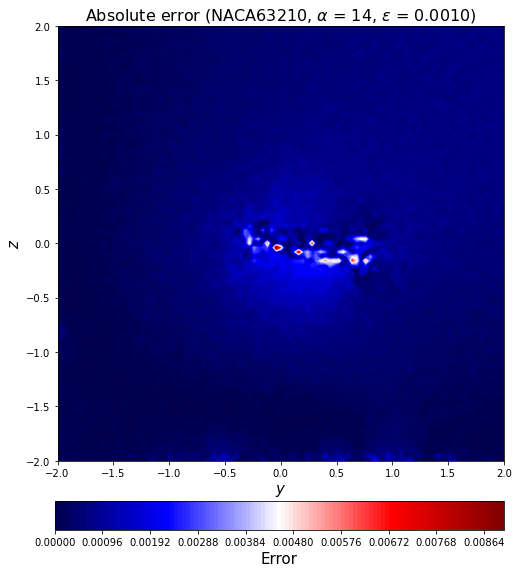

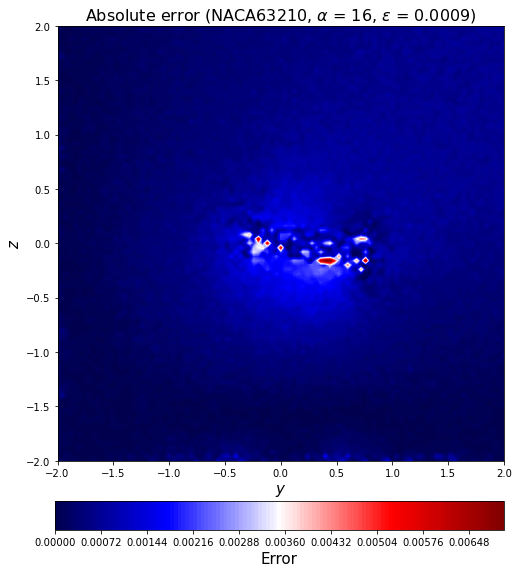

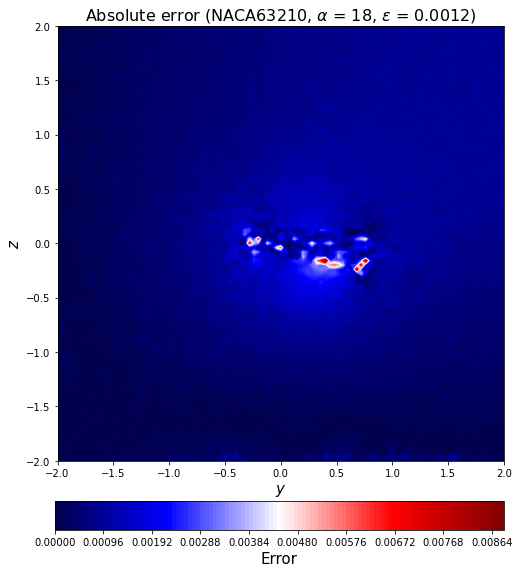

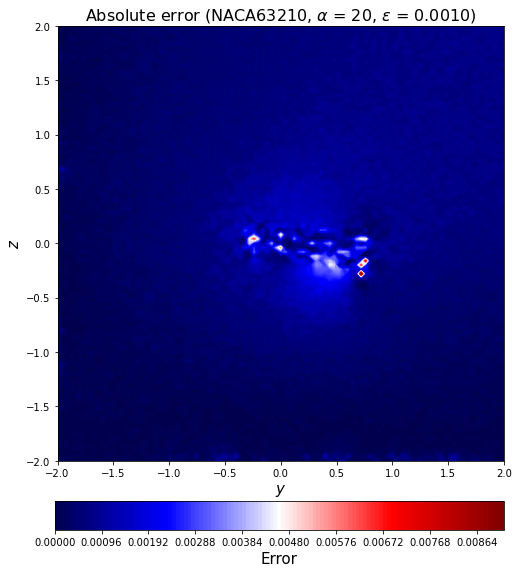

In [68]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Laplace_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

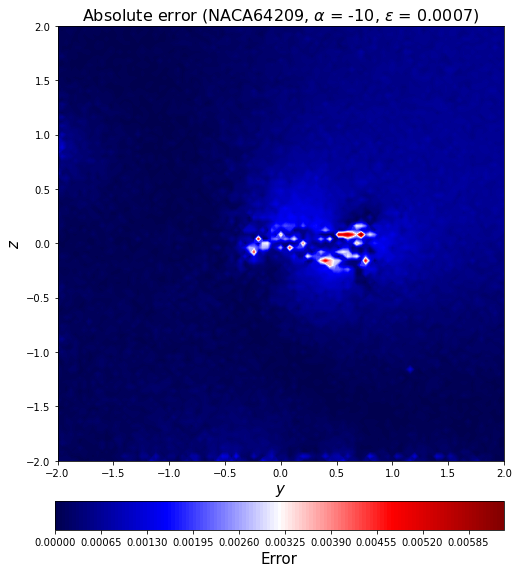

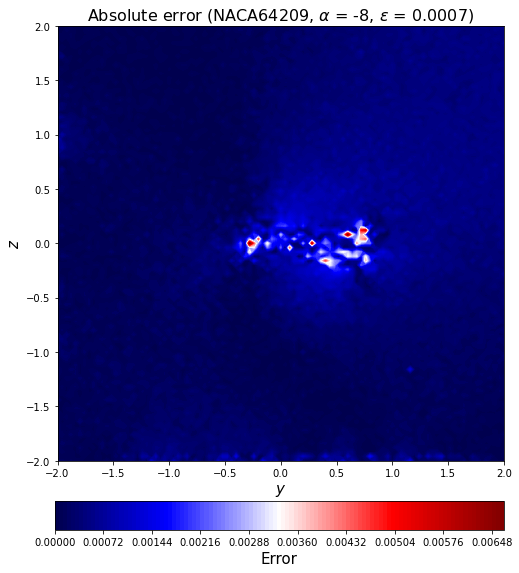

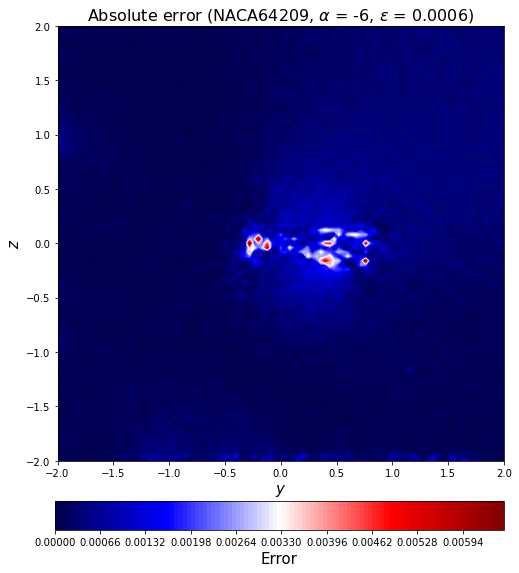

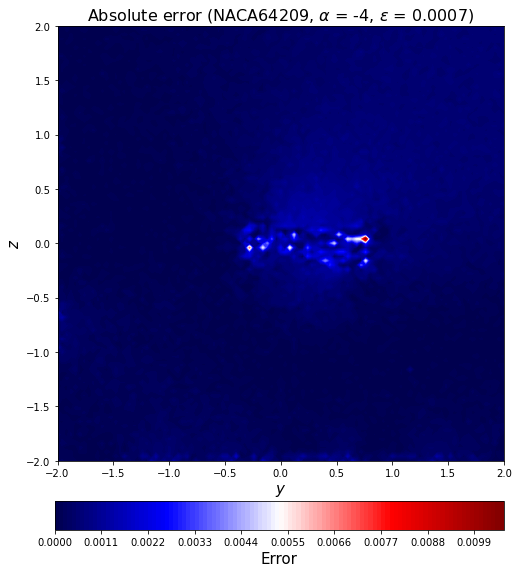

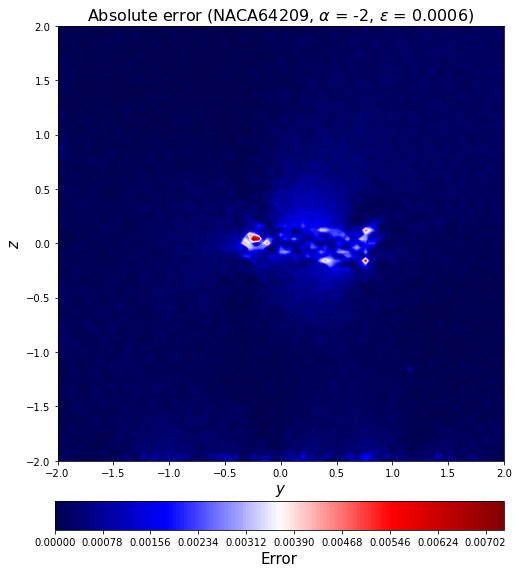

...

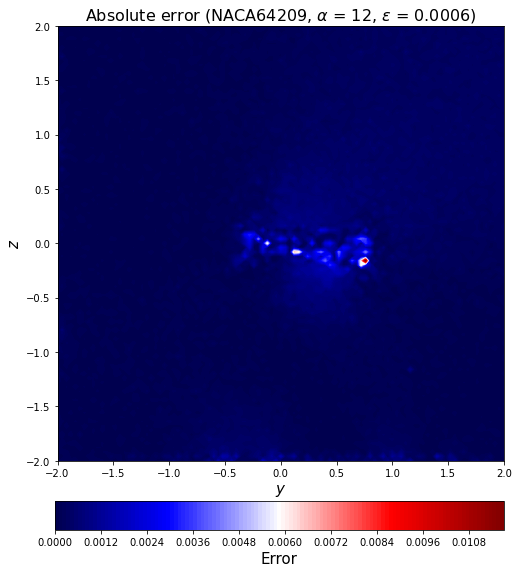

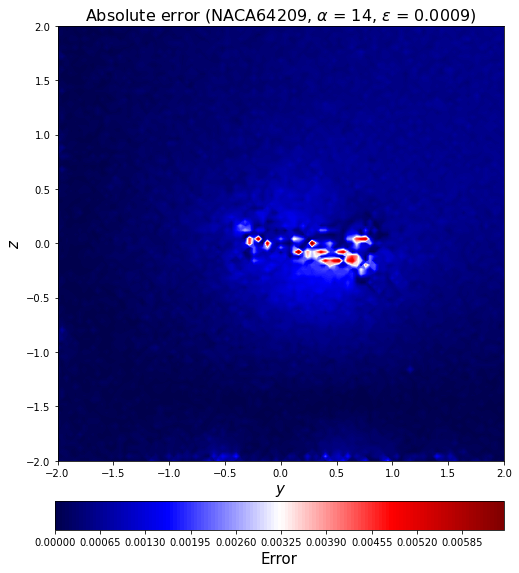

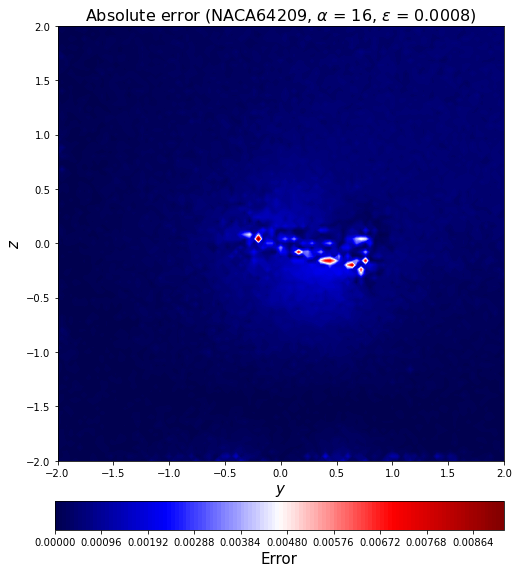

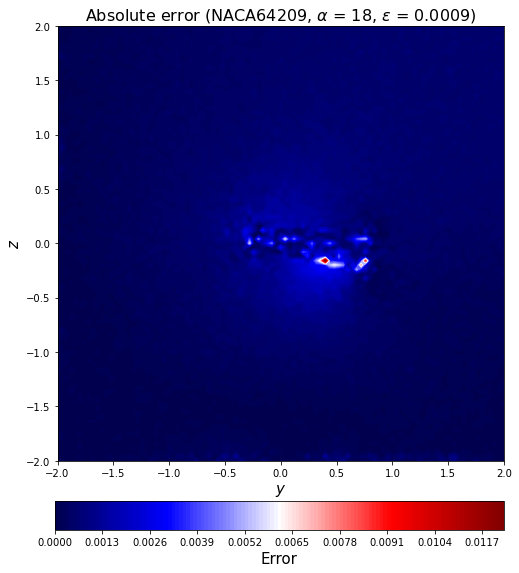

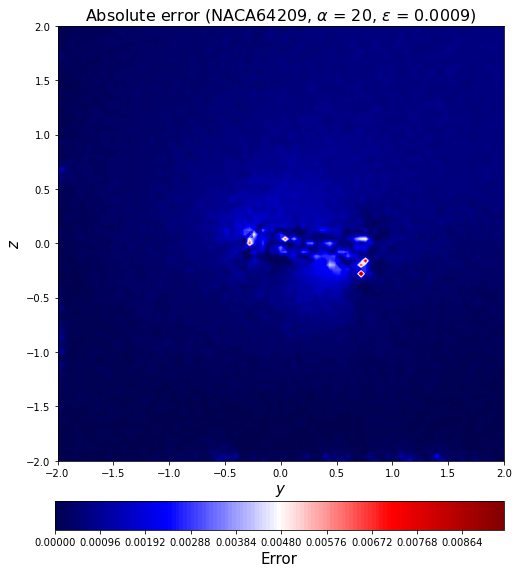

In [69]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Laplace_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

In [70]:
MAPE_train = (np.sum(np.abs(np.sum(y_train)-np.sum(decoded_train))) / np.abs(np.sum(y_train)))/(y_train.shape[0]/11)*100
acc_train = 1-MAPE_train

In [86]:
MAPE_val = (np.sum(np.abs(np.sum(y_val)-np.sum(decoded_val))) / np.abs(np.sum(y_val)))/(y_val.shape[0]/16)*100
acc_val = 1-MAPE_val

In [71]:
MAPE_test = (np.sum(np.abs(np.sum(y_test)-np.sum(decoded_test))) / np.abs(np.sum(y_test)))/(y_test.shape[0]/11)*100
acc_test = 1-MAPE_test

In [72]:
print(MAPE_train)
print(acc_train)

0.00013483253315184628
0.9998651674668482


In [87]:
print(MAPE_val)
print(acc_val)

0.004261163362263929
0.9957388366377361


In [73]:
print(MAPE_test)
print(acc_test)

4.1630693381958186e-05
0.9999583693066181


In [74]:
MAPE_train_list = []
acc_train_list = []
for i in range(0, len(aa_train)):
    MAPE_train_data = (np.sum(np.abs(y_train[i]-decoded_train[i])) / np.sum(np.abs(y_train[i])))/(y_train.shape[0]/11)*100
    MAPE_train_list.append(MAPE_train_data)
    acc_train_data = 1 - MAPE_train_data
    acc_train_list.append(acc_train_data)
print(MAPE_train_list)
print(acc_train_list)

[0.0004898639972186061, 0.0007053101336099618, 0.0005038926767143873, 0.0004043361297561453, 0.0003939738102439184, 0.0006950174208914842, 0.0004391110490794131, 0.00046955364938455356, 0.00045451846152761295, 0.0005638078517108353, 0.0004249153371359023, 0.0004585738072426703, 0.000450160490569308, 0.0006440447573482942, 0.0007008923110950977, 0.0006693852375596621, 0.00080952340340825, 0.000785754530473025, 0.0006082105373672184, 0.0006489320116434915, 0.0007922405884659961, 0.000735579844177245, 0.0008397682878356269, 0.0007824637975172063, 0.000577382588639573, 0.0007781282837103184, 0.0007547369313127993, 0.0006556610795190028, 0.0007157037832204447, 0.0008146582379140997, 0.0007906924200066185, 0.0007911626429458424, 0.0006229998041952555, 0.0004670538035745853, 0.0004642837000365286, 0.0006432791040580184, 0.0002524768299131865, 0.00037603655556433884, 0.00046193129787013714, 0.000425610552140519, 0.0004853484772657623, 0.00036182374068917454, 0.0005559658947827277, 0.0004011789

In [88]:
MAPE_val_list = []
acc_val_list = []
for i in range(0, len(aa_val)):
    MAPE_val_data = (np.sum(np.abs(y_val[i]-decoded_val[i])) / np.sum(np.abs(y_val[i])))/(y_val.shape[0]/16)*100
    MAPE_val_list.append(MAPE_val_data)
    acc_val_data = 1 - MAPE_val_data
    acc_val_list.append(acc_val_data)
print(MAPE_val_list)
print(acc_val_list)

[0.004821442118451955, 0.0034584371576953645, 0.004587543065761525, 0.003186632530778974, 0.0038359140222273976, 0.0040888151301936605, 0.0033659110673096, 0.003866688028356076, 0.003402318126921382, 0.0023048963906693435, 0.002926802077316687, 0.0026265033683799018, 0.0037502545678913175, 0.005090316999752453, 0.003831367823028437, 0.0032482758921704045, 0.0023639878969613504, 0.007003408875303091, 0.003955805791614204, 0.004068311393832364, 0.0031602498622620785, 0.004735222538512721, 0.0033578750826920288, 0.0032613095125885454, 0.0029197298400424894, 0.002922868132302774, 0.003984528111512796, 0.0032667715999933587, 0.003781290643176381, 0.002726346423419911, 0.0029993198146299306, 0.004159229447031585, 0.008977060744742745, 0.01157380747972239, 0.011000054687247504, 0.009707062237169137, 0.0077073822037614466, 0.005158434461080406, 0.008811413669357495, 0.009425704258503483, 0.010214577464539656, 0.008280447391122311, 0.008215577456534595, 0.006853935630719934, 0.00812464255359353

In [75]:
MAPE_test_list = []
acc_test_list = []
for i in range(0, len(aa_test)):
    MAPE_test_data = (np.sum(np.abs(y_test[i]-decoded_test[i])) / np.sum(np.abs(y_test[i])))/(y_test.shape[0]/11)*100
    MAPE_test_list.append(MAPE_test_data)
    acc_test_data = 1 - MAPE_test_data
    acc_test_list.append(acc_test_data)
print(MAPE_test_list)
print(acc_test_list)

[0.0026846266782858926, 0.0023814929708690295, 0.001956862212844388, 0.002440008940305397, 0.0017385642684059148, 0.0022474148051144223, 0.0022197003102732466, 0.0019775893127289335, 0.002705075972539501, 0.002030647076418289, 0.0022956771166407204, 0.0017575063374968296, 0.003177177292504432, 0.0028022700361360333, 0.003364946539523808, 0.003786188274663575, 0.002964230762351317, 0.003994133505815587, 0.0036435244845195746, 0.0030322157311708734, 0.0025918227902255904, 0.0021550015370505006, 0.0024643358922193386, 0.0028679965549875007, 0.0029899476611807774, 0.0029684159416028763, 0.0027388637280639895, 0.0030497421275146974, 0.002946225566712295, 0.002965580217993046, 0.0031796725160622014, 0.0027436333198969693, 0.004981472423800084, 0.004123969184386976, 0.006268101371110577, 0.003463386461922592, 0.0025975006315533083, 0.0028738443586911245, 0.004678717733505336, 0.004337717635209734, 0.003203984869752552, 0.003921281615455259, 0.004441915995046515, 0.0042728828053908005, 0.00375

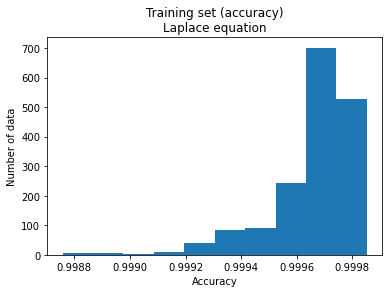

In [91]:
plt.hist(acc_train_list)
plt.title('Training set (accuracy)\nLaplace equation')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')

plt.show()

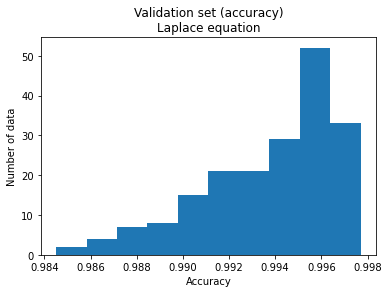

In [90]:
plt.hist(acc_val_list)
plt.title('Validation set (accuracy)\nLaplace equation')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
plt.show()

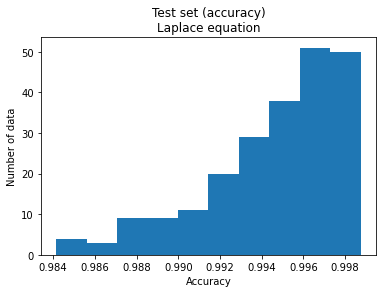

In [77]:
plt.hist(acc_test_list)
plt.title('Test set (accuracy)\nLaplace equation')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
plt.show()

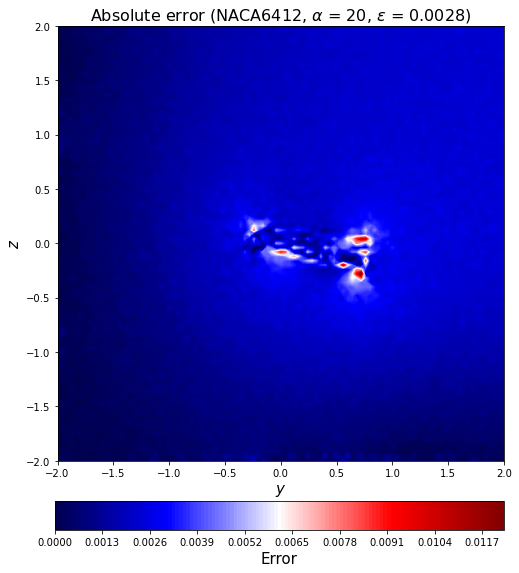

In [78]:
error_test_abs2_rotate = error_test_abs[-1].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-1])[3:-2],
                                                                   aa_test[-1], l2_error_test_list[-1]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Laplace_bc2(test)"+str(np.array2string(geo_test[-1])[3:-2])+str(aa_test[-1])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

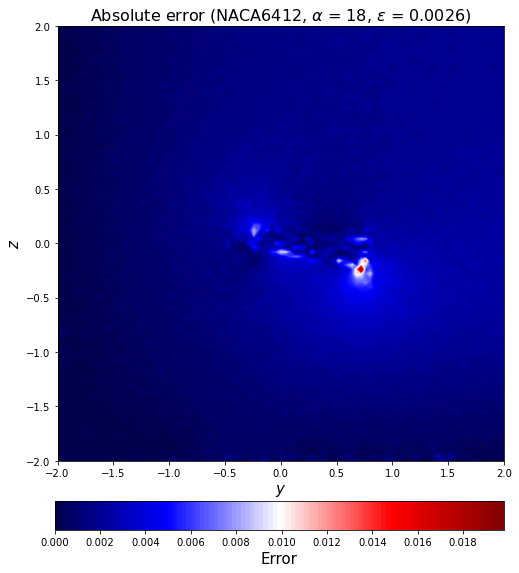

In [79]:
error_test_abs2_rotate = error_test_abs[-2].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-2])[3:-2],
                                                                   aa_test[-2], l2_error_test_list[-2]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Laplace_bc2(test)"+str(np.array2string(geo_test[-2])[3:-2])+str(aa_test[-2])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

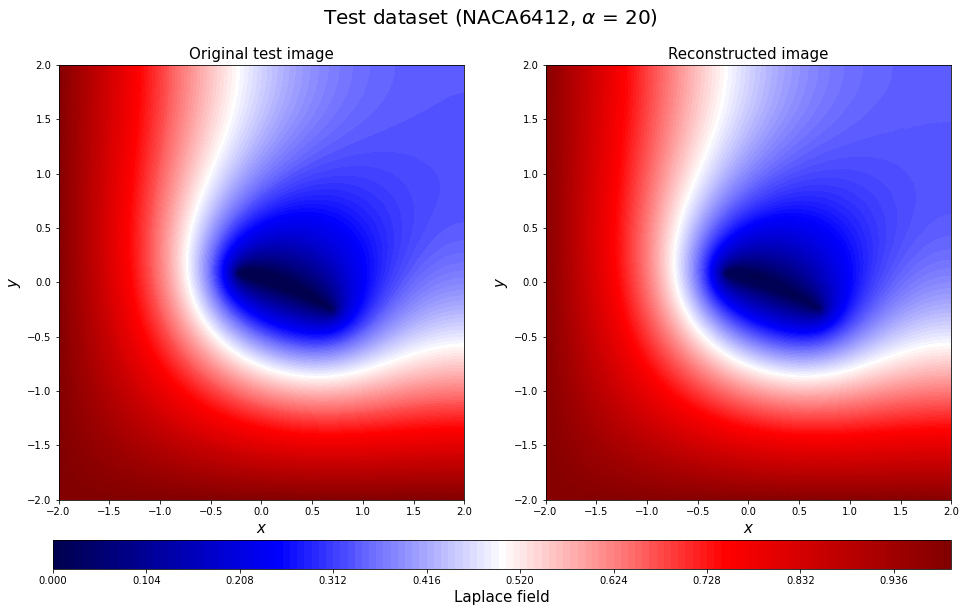

In [80]:
c=-1
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Laplace field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Laplace_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

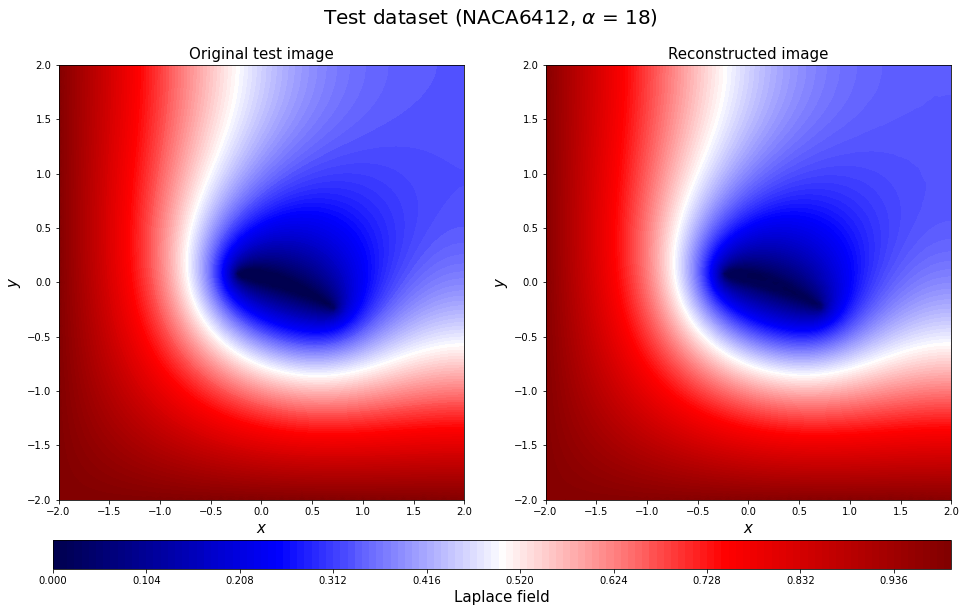

In [81]:
c=-2
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Laplace field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Laplace_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

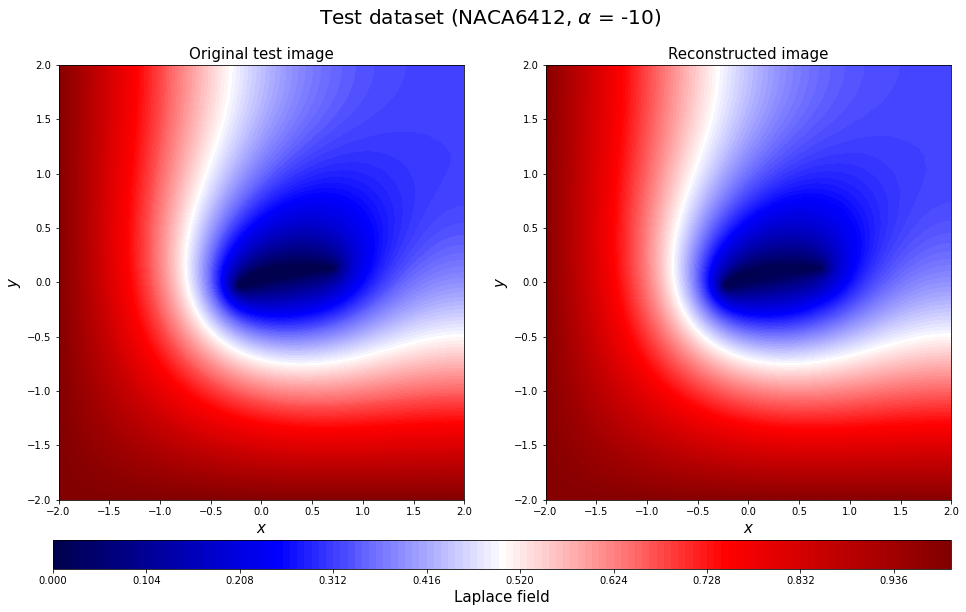

In [82]:
c=-16
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Laplace field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Laplace_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

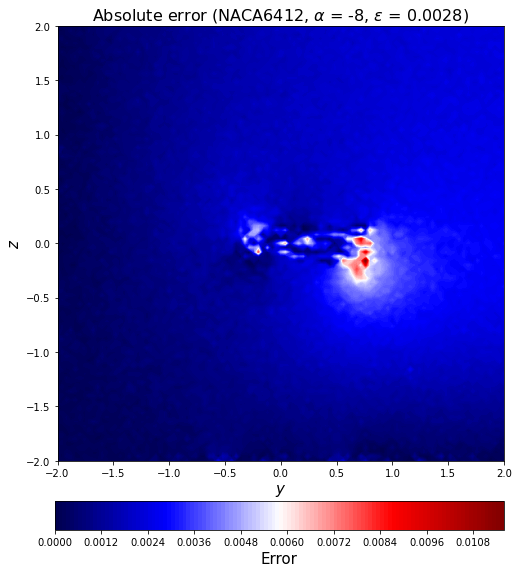

In [83]:
error_test_abs2_rotate = error_test_abs[-15].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-15])[3:-2],
                                                                   aa_test[-15], l2_error_test_list[-15]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Laplace_bc2(test)"+str(np.array2string(geo_test[-15])[3:-2])+str(aa_test[-15])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

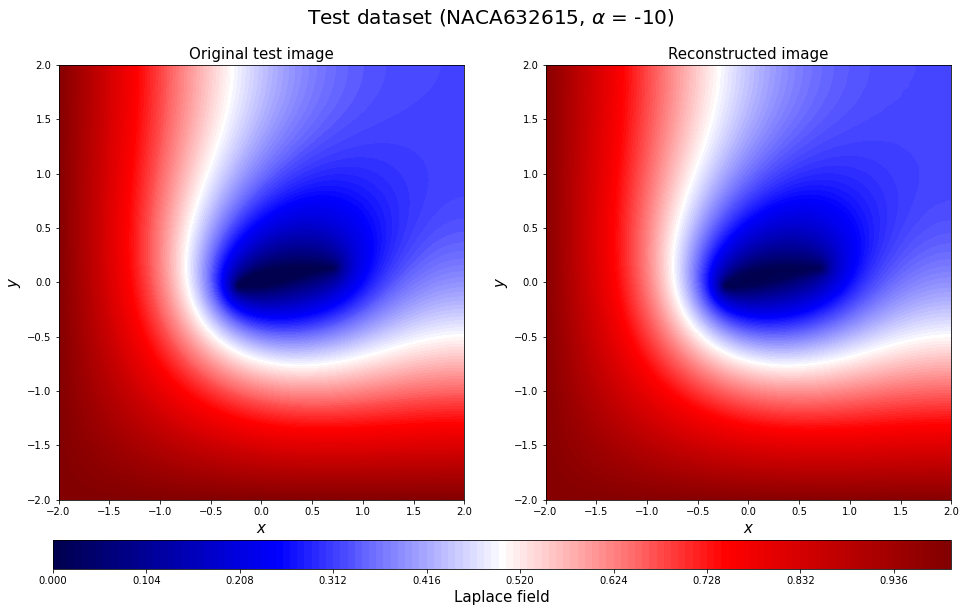

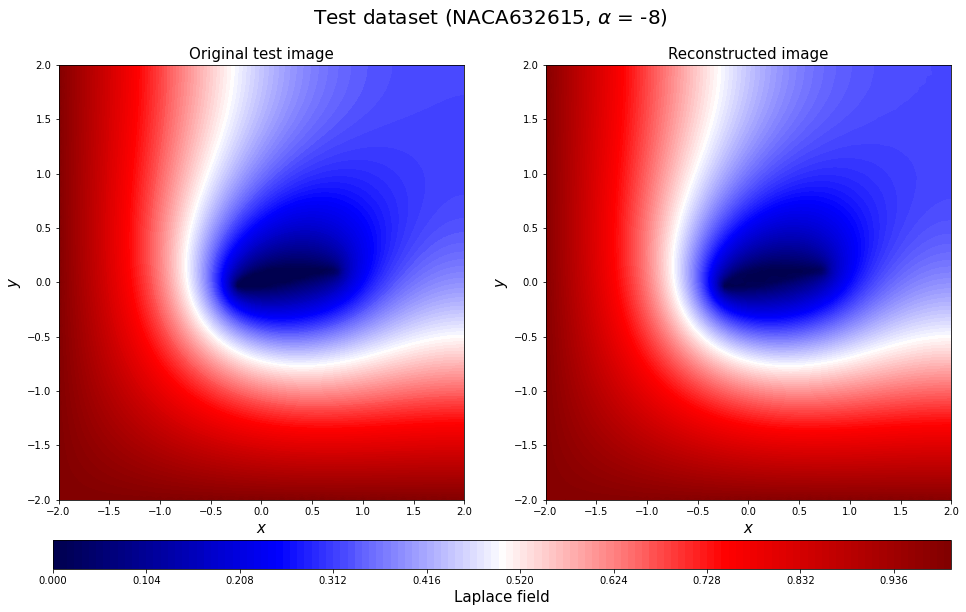

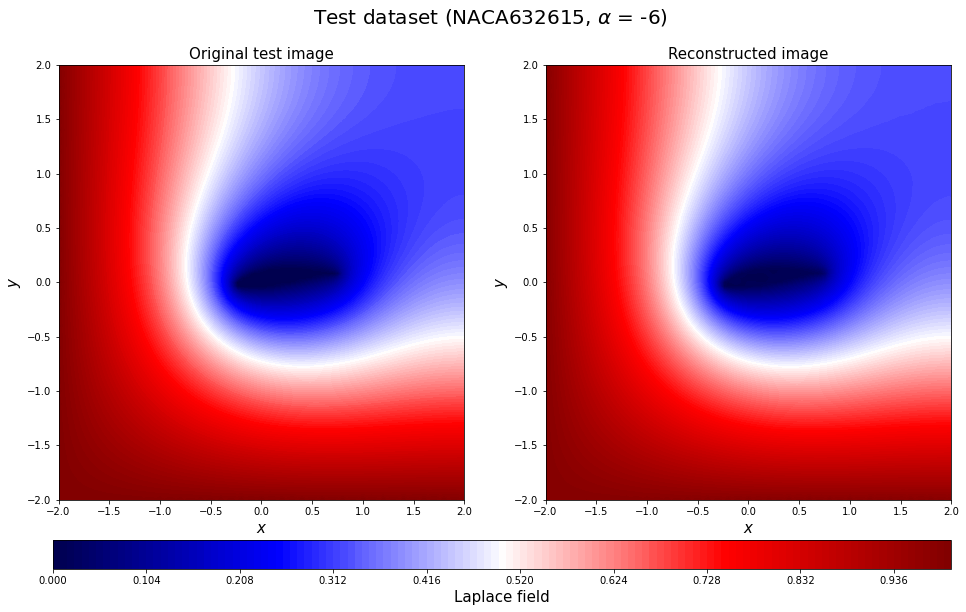

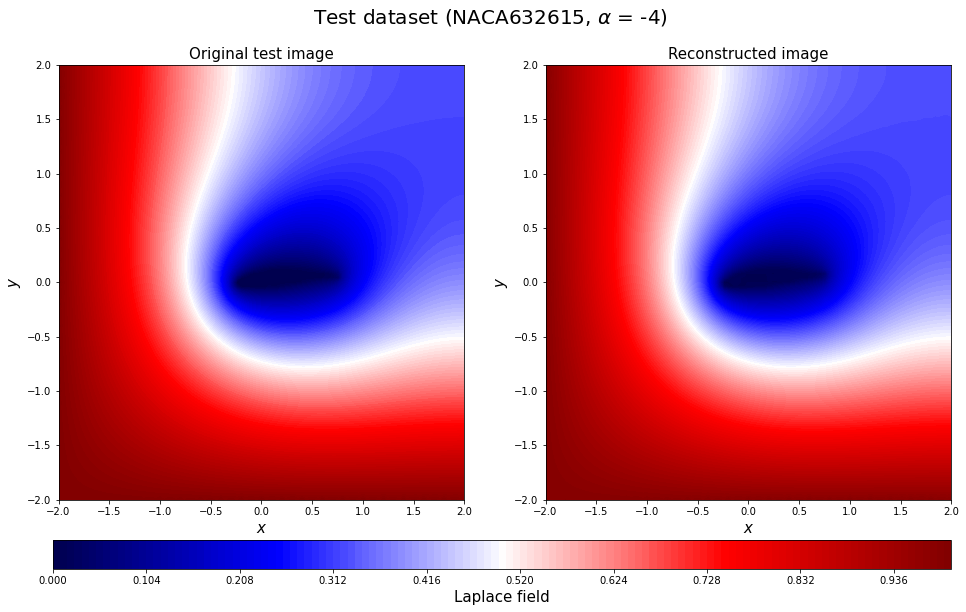

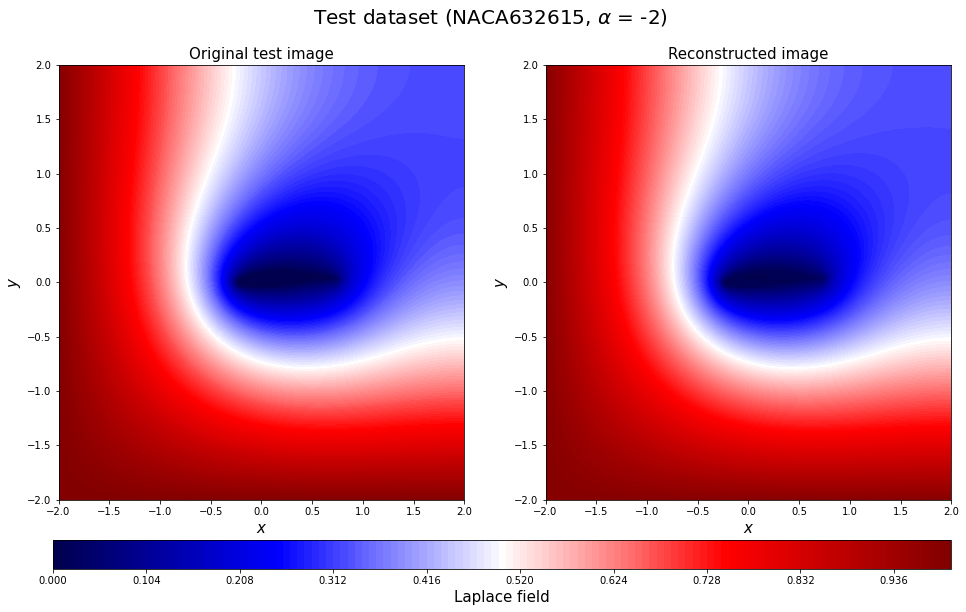

...

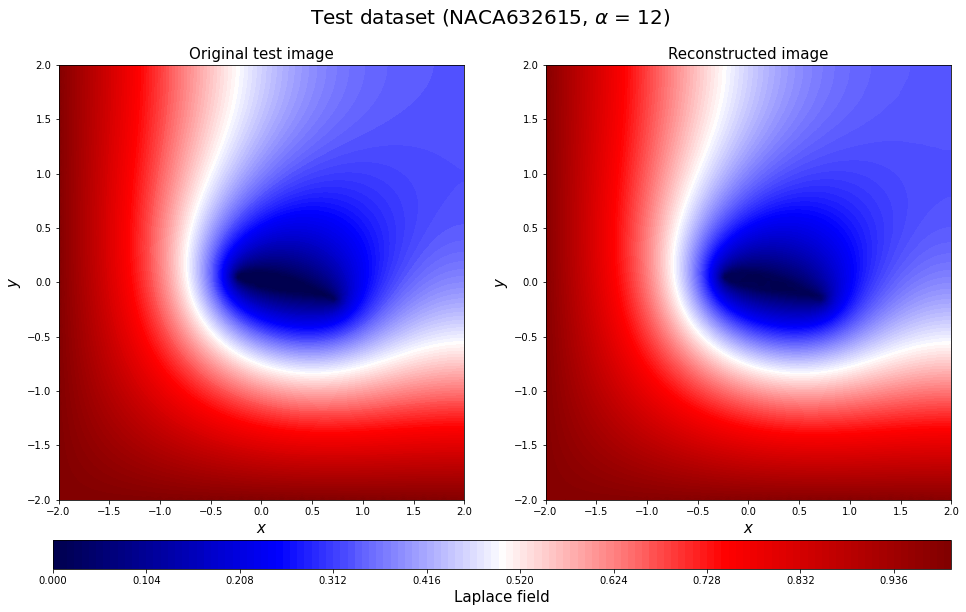

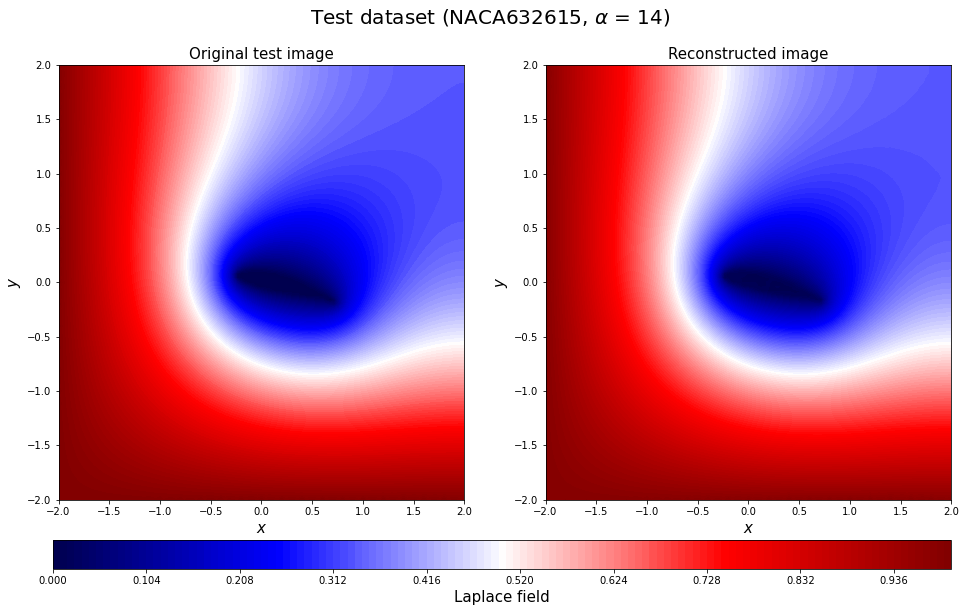

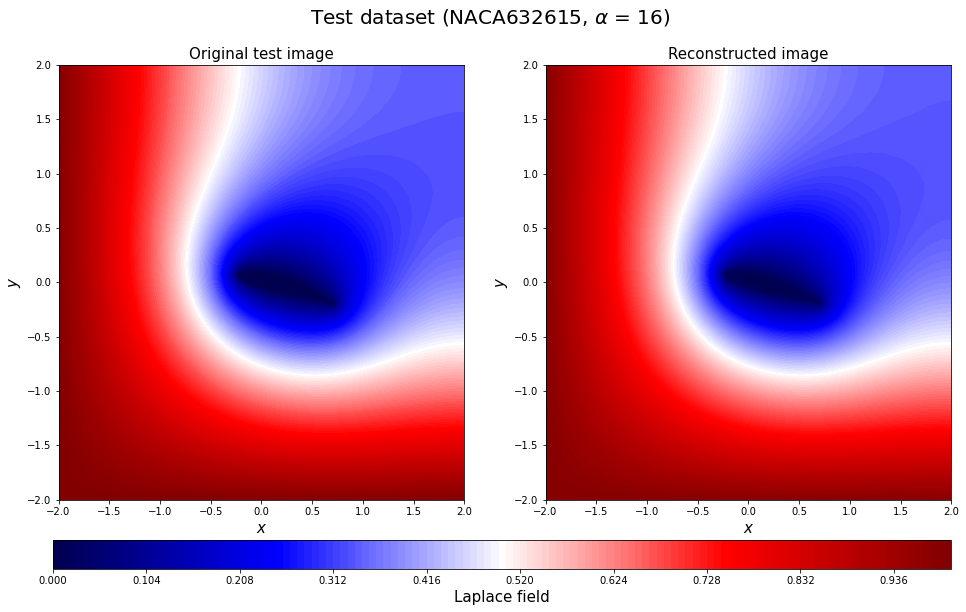

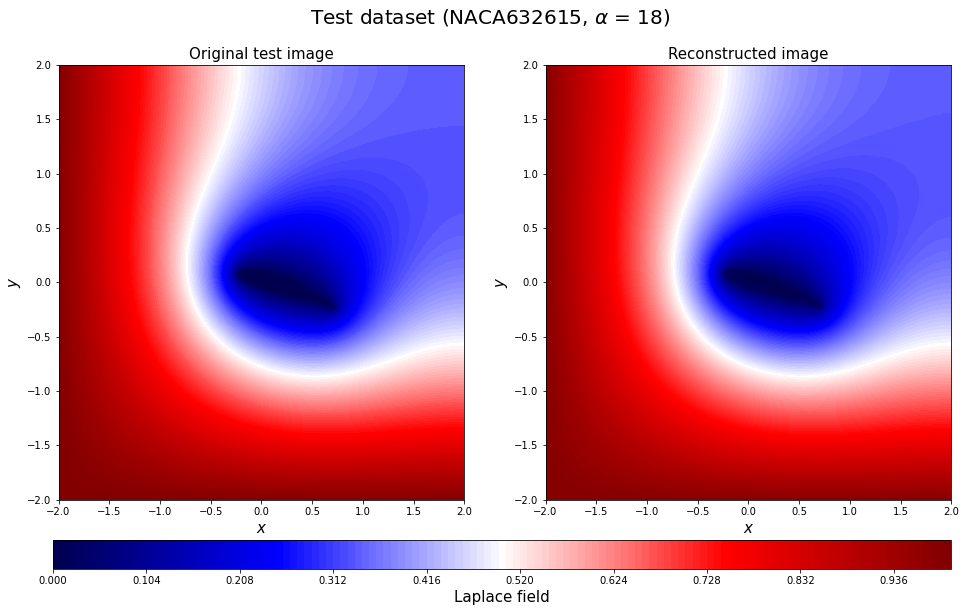

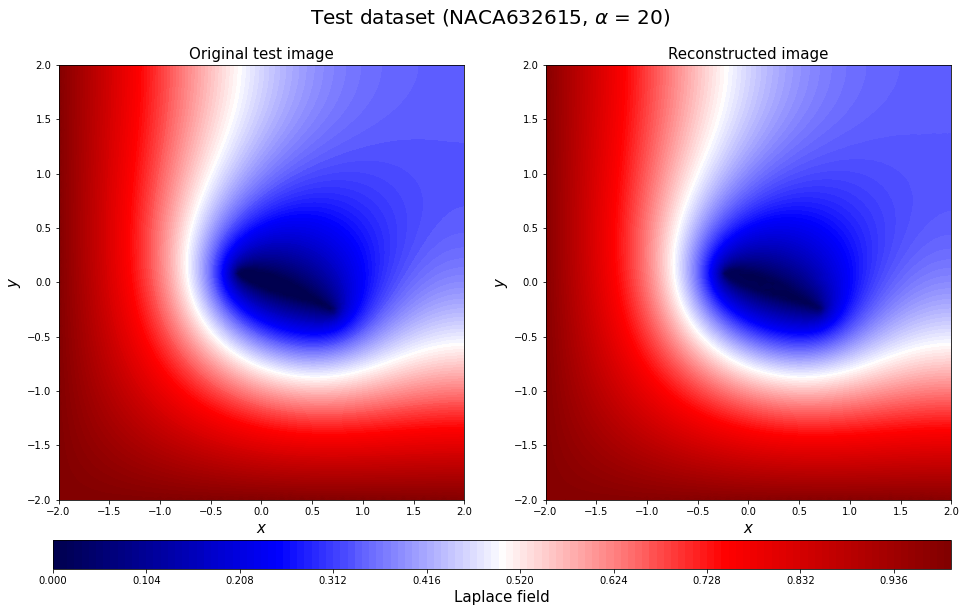

In [84]:
for c in range(96,112):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Laplace field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Laplace_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

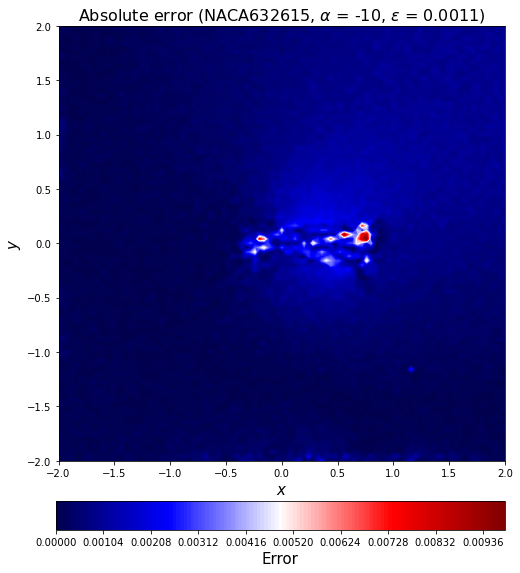

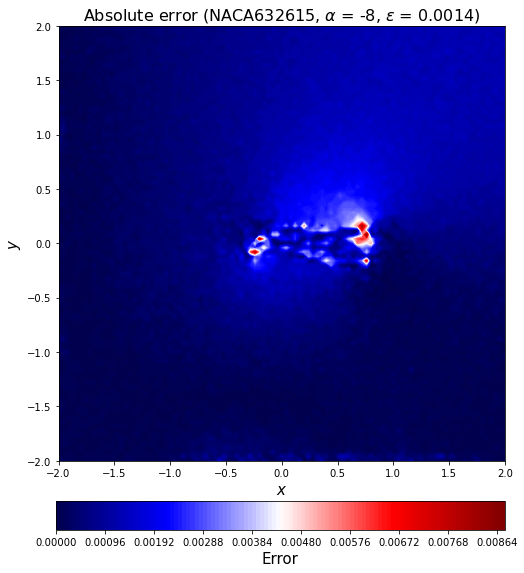

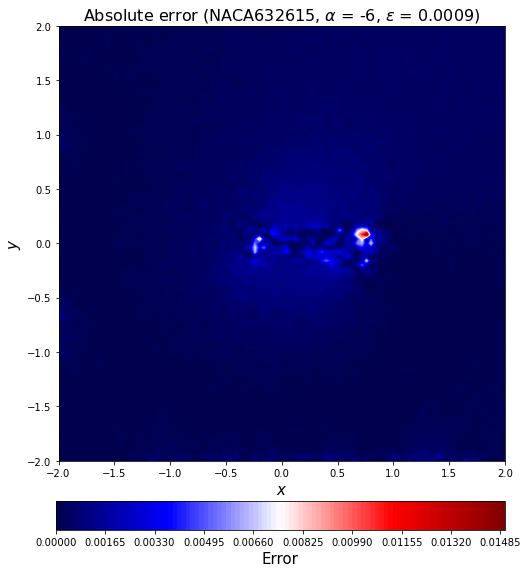

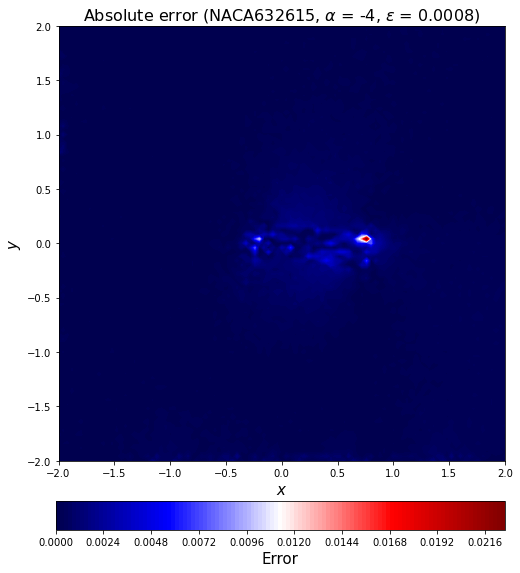

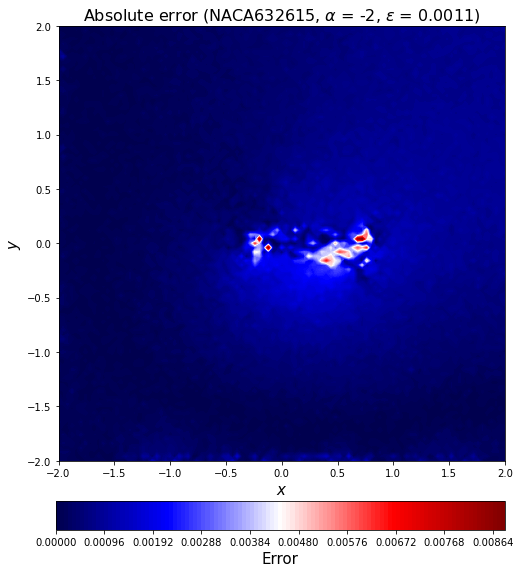

...

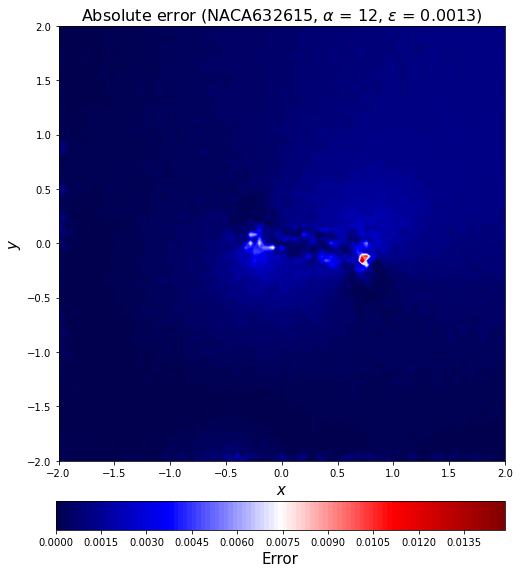

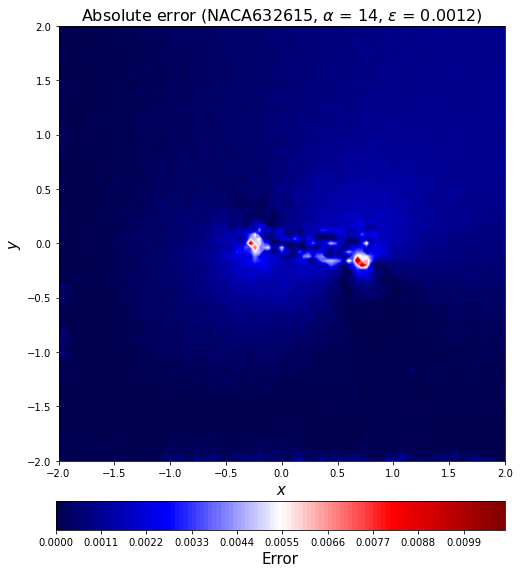

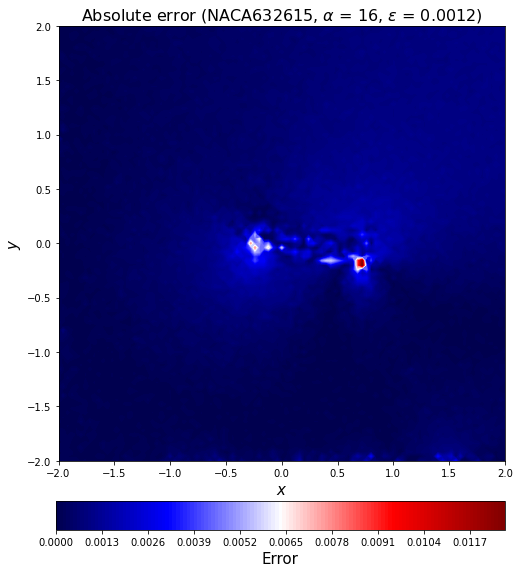

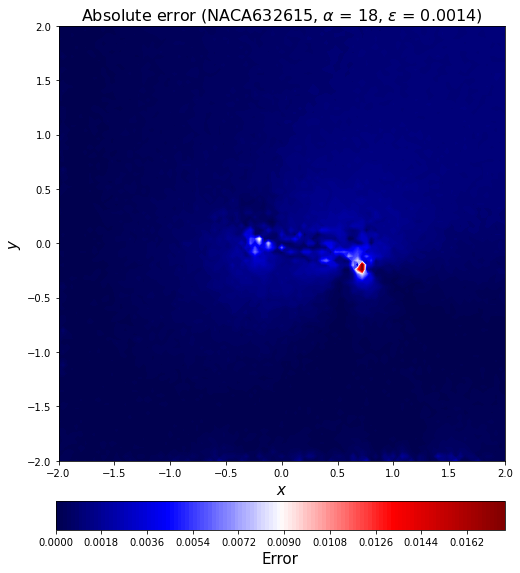

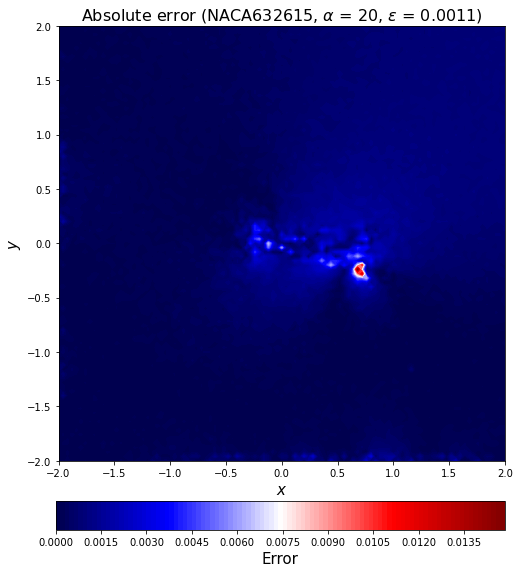

In [85]:
for c in range(96,112):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Laplace_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()